In [1]:
# Basic reading of data

import pandas as pd

pd.set_option('display.max_columns', 30)
twitter_data = pd.read_csv('hashtag_data.csv')
twitter_data.head()

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,tweet,mentions,urls,photos,replies_count,...,link,retweet,quote_url,video,near,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1.262790e+18,1.262790e+18,1.589910e+12,19-05-2020,16:51:14,UTC,1.250080e+18,dramaflick,The Drama Flick,NaN,https://www.youtube.com/watch?v=-CRbO7ExO1k …...,[],['https://www.youtube.com/watch?v=-CRbO7ExO1k'],[],0,...,https://twitter.com/DramaFlick/status/12627879...,False,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '1250079805980045318', 'username'...",NaN,NaN,NaN,NaN
1,1.262790e+18,1.262790e+18,1.589910e+12,19-05-2020,16:50:44,UTC,8.078430e+17,knowpuneet,TravelTrainee,NaN,Lockdown 4.0 ka.naam hi lockdown hai\nHai sab ...,[],[],[],0,...,https://twitter.com/knowpuneet/status/12627877...,False,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '807843238648299520', 'username':...",NaN,NaN,NaN,NaN
2,1.262790e+18,1.262790e+18,1.589910e+12,19-05-2020,16:48:29,UTC,1.085430e+18,narasinhpurohit,Narasinh Purohit,NaN,CORONA VIRUS THREAT-\nHOW TO OVERCOME STRESS A...,[],['https://sarasarvivek.blogspot.com/2019/08/ho...,['https://pbs.twimg.com/media/EYZRzkGUcAEMSWx....,0,...,https://twitter.com/NarasinhPurohit/status/126...,False,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '1085426639570235392', 'username'...",NaN,NaN,NaN,NaN
3,1.262790e+18,1.262790e+18,1.589910e+12,19-05-2020,16:47:36,UTC,1.104210e+18,ka_trolls,Humans Of Hindutva,NaN,Could you please\n\n#lockdownindia\n@Bhuvan_Ba...,"['bhuvan_bam', 'ashchanchlani', 'lakshayhere',...",['https://youtu.be/FtZHY2bRbCQ'],[],0,...,https://twitter.com/ka_trolls/status/126278699...,False,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '1104213868467806208', 'username'...",NaN,NaN,NaN,NaN
4,1.262790e+18,1.262790e+18,1.589910e+12,19-05-2020,16:47:29,UTC,3.921802e+08,rajendrabohora,rajendrabohora,NaN,"In fight with #COVID19, You are the best Docto...",[],[],[],1,...,https://twitter.com/rajendrabohora/status/1262...,False,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '392180204', 'username': 'rajendr...",NaN,NaN,NaN,NaN


In [2]:
# Neglecting redundant columns and considering relevant columns for analysis

twitter_data = twitter_data[['tweet', 'hashtags']]
twitter_data

,tweet,hashtags
0,https://www.youtube.com/watch?v=-CRbO7ExO1k …...,"['#lockdownindia', '#lockdown', '#indiafightsc..."
1,Lockdown 4.0 ka.naam hi lockdown hai\nHai sab ...,"['#lockdownindia', '#locldown4']"
2,CORONA VIRUS THREAT-\nHOW TO OVERCOME STRESS A...,"['#covid_19', '#covid_19sa', '#covid_19india',..."
3,Could you please\n\n#lockdownindia\n@Bhuvan_Ba...,"['#lockdownindia', '#roastchallenge', '#journa..."
4,"In fight with #COVID19, You are the best Docto...","['#covid19', '#coronavirus', '#patiencechallen..."
...,...,...
124379,I pledge to follow the appeal given by Hon'ble...,"['#staysafestayhome', '#janta_curfew', '#janta..."
124380,Four new cases of Coronavirus detected in Luck...,"['#coronaindia', '#coronavirusoutbreakindia', ..."
124381,Do you sometimes feel a tingling #sensation or...,"['#sensation', '#hands', '#thevoiceofwoman', '..."
124382,Some Time we have to Stay Back ... Just to Sav...,"['#stayback', '#gobackcorona', '#coronafighter..."


In [3]:
print('---Print the Head/Tail of the data-----')
print(twitter_data.head())
print('---------------------------------------')
print(twitter_data.tail())

---Print the Head/Tail of the data-----
                                               tweet  \
0   https://www.youtube.com/watch?v=-CRbO7ExO1k …...   
1  Lockdown 4.0 ka.naam hi lockdown hai\nHai sab ...   
2  CORONA VIRUS THREAT-\nHOW TO OVERCOME STRESS A...   
3  Could you please\n\n#lockdownindia\n@Bhuvan_Ba...   
4  In fight with #COVID19, You are the best Docto...   

                                            hashtags  
0  ['#lockdownindia', '#lockdown', '#indiafightsc...  
1                   ['#lockdownindia', '#locldown4']  
2  ['#covid_19', '#covid_19sa', '#covid_19india',...  
3  ['#lockdownindia', '#roastchallenge', '#journa...  
4  ['#covid19', '#coronavirus', '#patiencechallen...  
---------------------------------------
                                                    tweet  \
124379  I pledge to follow the appeal given by Hon'ble...   
124380  Four new cases of Coronavirus detected in Luck...   
124381  Do you sometimes feel a tingling #sensation or...   
124382  S

In [4]:
print('---Print the basic info of the data-----')
print(twitter_data.info())
print(twitter_data.shape)
print(twitter_data.dtypes)

---Print the basic info of the data-----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124384 entries, 0 to 124383
Data columns (total 2 columns):
tweet       124384 non-null object
hashtags    124384 non-null object
dtypes: object(2)
memory usage: 1.9+ MB
None
(124384, 2)
tweet       object
hashtags    object
dtype: object


In [5]:
import re
import emoji
# Create a function to clean the tweets
def cleanTxt(text):
    text = re.sub('@[A-Za-z0–9]+', '', text) #Removing @mentions
    text = re.sub('#', '', text) # Removing '#' hash tag
    text = re.sub('RT[\s]+', '', text) # Removing RT
    text = re.sub('https?:\/\/\S+', '', text) # Removing hyperlink
    text = re.sub('(\n)', ' ', text) # Removing newline (\n) characters
    text = emoji.demojize(text)
    return text
# Clean the tweets
twitter_data['tweet'] = twitter_data['tweet'].apply(cleanTxt)
twitter_data['hashtags'] = twitter_data['hashtags'].apply(cleanTxt)

# Show the cleaned tweets
twitter_data


,tweet,hashtags
0,… THE DRAMA FLICK presents LOCKDOWN 4 that ...,"['lockdownindia', 'lockdown', 'indiafightscovi..."
1,Lockdown 4.0 ka.naam hi lockdown hai Hai sab u...,"['lockdownindia', 'locldown4']"
2,CORONA VIRUS THREAT- HOW TO OVERCOME STRESS AN...,"['covid_19', 'covid_19sa', 'covid_19india', 'l..."
3,Could you please lockdownindia _Bam RoastC...,"['lockdownindia', 'roastchallenge', 'journalis..."
4,"In fight with COVID19, You are the best Doctor...","['covid19', 'coronavirus', 'patiencechallenge'..."
...,...,...
124379,I pledge to follow the appeal given by Hon'ble...,"['staysafestayhome', 'janta_curfew', 'jantacur..."
124380,Four new cases of Coronavirus detected in Luck...,"['coronaindia', 'coronavirusoutbreakindia', 'c..."
124381,Do you sometimes feel a tingling sensation or ...,"['sensation', 'hands', 'thevoiceofwoman', 'cor..."
124382,Some Time we have to Stay Back ... Just to Sav...,"['stayback', 'gobackcorona', 'coronafighters',..."


In [6]:
# Combining tweet and hashtags for better analysis

twitter_data["tweets"] = twitter_data["tweet"] + twitter_data["hashtags"]
twitter_data = twitter_data[['tweets']]
twitter_data

,tweets
0,… THE DRAMA FLICK presents LOCKDOWN 4 that ...
1,Lockdown 4.0 ka.naam hi lockdown hai Hai sab u...
2,CORONA VIRUS THREAT- HOW TO OVERCOME STRESS AN...
3,Could you please lockdownindia _Bam RoastC...
4,"In fight with COVID19, You are the best Doctor..."
...,...
124379,I pledge to follow the appeal given by Hon'ble...
124380,Four new cases of Coronavirus detected in Luck...
124381,Do you sometimes feel a tingling sensation or ...
124382,Some Time we have to Stay Back ... Just to Sav...


In [7]:
from textblob import TextBlob

# Create a function to get the subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

# Create a function to get the polarity
def getPolarity(text):
    return  TextBlob(text).sentiment.polarity


# Create two new columns 'Subjectivity' & 'Polarity'
twitter_data['Subjectivity'] = twitter_data['tweets'].apply(getSubjectivity)
twitter_data['Polarity'] = twitter_data['tweets'].apply(getPolarity)

# Show the new dataframe with columns 'Subjectivity' & 'Polarity'
twitter_data

C:\Users\vsing\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


,tweets,Subjectivity,Polarity
0,… THE DRAMA FLICK presents LOCKDOWN 4 that ...,0.540000,0.160000
1,Lockdown 4.0 ka.naam hi lockdown hai Hai sab u...,0.288889,-0.155556
2,CORONA VIRUS THREAT- HOW TO OVERCOME STRESS AN...,0.500000,0.500000
3,Could you please lockdownindia _Bam RoastC...,0.000000,0.000000
4,"In fight with COVID19, You are the best Doctor...",0.650000,0.333333
...,...,...,...
124379,I pledge to follow the appeal given by Hon'ble...,0.000000,0.000000
124380,Four new cases of Coronavirus detected in Luck...,0.454545,0.136364
124381,Do you sometimes feel a tingling sensation or ...,0.166667,-0.166667
124382,Some Time we have to Stay Back ... Just to Sav...,0.000000,0.000000


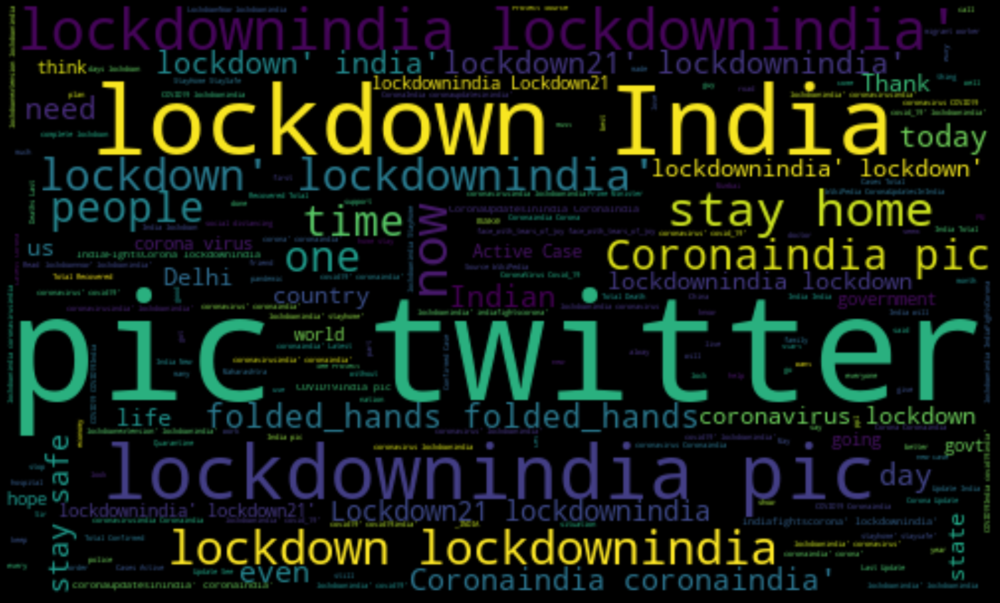

In [8]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline

# word cloud visualization
allWords = ' '.join([twts for twts in twitter_data['tweets']])
wordCloud = WordCloud(width=500, height=300, random_state=21, max_font_size=110).generate(allWords)
fig=plt.figure(figsize=(20,20), facecolor='k', edgecolor='w')


plt.imshow(wordCloud, interpolation="bilinear")
plt.tight_layout()
plt.axis('off')
plt.show()

In [9]:
# Create a function to compute negative (-1), neutral (0) and positive (+1) analysis
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'
twitter_data['Analysis'] = twitter_data['Polarity'].apply(getAnalysis)
# Show the dataframe
twitter_data

,tweets,Subjectivity,Polarity,Analysis
0,… THE DRAMA FLICK presents LOCKDOWN 4 that ...,0.540000,0.160000,Positive
1,Lockdown 4.0 ka.naam hi lockdown hai Hai sab u...,0.288889,-0.155556,Negative
2,CORONA VIRUS THREAT- HOW TO OVERCOME STRESS AN...,0.500000,0.500000,Positive
3,Could you please lockdownindia _Bam RoastC...,0.000000,0.000000,Neutral
4,"In fight with COVID19, You are the best Doctor...",0.650000,0.333333,Positive
...,...,...,...,...
124379,I pledge to follow the appeal given by Hon'ble...,0.000000,0.000000,Neutral
124380,Four new cases of Coronavirus detected in Luck...,0.454545,0.136364,Positive
124381,Do you sometimes feel a tingling sensation or ...,0.166667,-0.166667,Negative
124382,Some Time we have to Stay Back ... Just to Sav...,0.000000,0.000000,Neutral


In [10]:
# Printing positive tweets 
print('Printing positive tweets:\n')
j=1
sortedDF = twitter_data.sort_values(by=['Polarity']) #Sort the tweets
for i in range(0, sortedDF.shape[0] ):
    if( sortedDF['Analysis'][i] == 'Positive'):
        print(str(j) + ') '+ sortedDF['tweets'][i])
        print()
        j= j+1

Printing positive tweets:

1)   …  THE DRAMA FLICK presents LOCKDOWN 4 that comes in our lives with some relaxations and smiles. Let's keep the spirits high and keep fighting.  PLEASE do hit the subscribe button.  lockdownindia lockdown IndiaFightsCOVID19 Lockdown4point0 guidelines['lockdownindia', 'lockdown', 'indiafightscovid19', 'lockdown4point0', 'guidelines']

2) CORONA VIRUS THREAT- HOW TO OVERCOME STRESS AND ANXIETY   … Yes, we can make the most of the Lockdown period... Covid_19 Covid_19SA Covid_19india Lockdown3 lockdownindia Lockdownlevel4 lockdowneffect pic.twitter.com/VLYjmDbMNT['covid_19', 'covid_19sa', 'covid_19india', 'lockdown3', 'lockdownindia', 'lockdownlevel4', 'lockdowneffect']

3) In fight with COVID19, You are the best Doctor for yourself. No degree required. Common sense & necessary precautions are good enough. Use your own capabilities, help yourself and defeat coronavirus PatienceChallenge Covid_19 Covid_19india IndiaFightsCorona lockdownindia['covid19', 'coron


742) This Lockdown 4.0 make the best of it :heavy_dollar_sign::money_bag::sparkles:  Start trading and making money at your Home ! Stay Safe  Open a demat trading account now! Register link in Bio:fast_up_button:  Dm us or call for enquiry. @ Lockdown India   …[]

743) Lockdown 4.0 Uttar Pradesh new guidelines     lockdownindia lockdown4guidelines['lockdownindia', 'lockdown4guidelines']

744) In this lockdown, India plans to go completely digital. But How is this possible if the students burdened with heavy taxes. _Council: Abolish the 18% GST on Higher Education - Sign the Petition!    via _India[]

745) Amazing avifauna of India.   Danger around -The Black-necked Stork  BirdsofIndia indianbirds birding birdwatching birdphotography birds lockdownindia wildlife nature wildlifephotography NaturePhotography MondayMotivation BirdsConnectUs India birdlovers bird stork pic.twitter.com/xEz5jA8Jho['birdsofindia', 'indianbirds', 'birding', 'birdwatching', 'birdphotography', 'birds', 'lockdown

1711) Only medical professionals should make the call on safe lifting of lockdown. India with 1.3 billion people has to be cautious. China not listenening to Dr Li in Wuhan has put the world in this chaos, don't forget.['india', 'china', 'wuhan']

1712) I don't think lockdown is a solution anymore . People are stranded, losing jobs, losing money and many are going through severe mental health issues. lockdownindia LockdownExtended IndiaFightsCoronavirus Corona COVID2019india['lockdownindia', 'lockdownextended', 'indiafightscoronavirus', 'corona', 'covid2019india']

1713) LockdownExtended I don't think lockdown is a solution anymore. People are stranded, losing jobs, losing money, losing Lives and many are going through severe mental health issues. lockdownindia['lockdownextended', 'lockdown', 'lockdownindia']

1714) lockdown is a not a solution anymore. People are stranded, losing jobs, losing money and many are going through severe mental stress and health issues. Make people understa

2813) Karnataka High Court To Permit Physical Filing Of Cases On Experimental Basis Amid COVID-19 Lockdown - India Legal  []

2814) Don't call yourself a IT employee if you can't apply sick leave though you are fit and fine :face_with_tongue: WednesdayThoughts lockdownindia['wednesdaythoughts', 'lockdownindia']

2815) Kuch ho ya na ho, INDIA would be cleaner and greener :raising_hands: People would know why cleanliness is important :grinning_face_with_big_eyes: SwachhBharat lockdown india COVID19India['swachhbharat', 'lockdown', 'india', 'covid19india']

2816) 2 more COVID19 cases reported in Chandigarh today. Total number of cases in the Union Territory (UT) is now at 189, including 3 fatalities: UT Health Department  coronavirus Covid_19india lockdownindia lockdown CoronavirusUpdates pic.twitter.com/HhlZWtNLty['covid19', 'chandigarh', 'coronavirus', 'covid_19india', 'lockdownindia', 'lockdown', 'coronavirusupdates']

2817) Are you able to find all the 3 shopping items? Take a screens

3636) Click on below link and watch my latest film on LockDown      LockdownEnd lockdownpakistan Covid_19 Lockdownextention lockdownindia['lockdownend', 'lockdownpakistan', 'covid_19', 'lockdownextention', 'lockdownindia']

3637) Great  work by  team.  Covid_19india lockdownindia CoronaWarriors  …['covid_19india', 'lockdownindia', 'coronawarriors']

3638) Covid_19 CoronaUpdatesInIndia lockdown lockdownindia When PM Meeting with CMs what you expect tomorrow news ? It's a new world it's a new start It's alive with the beating of young hearts It's a new day it's a new plan I've been waiting for you['covid_19', 'coronaupdatesinindia', 'lockdown', 'lockdownindia']

3639) cmyogiadityanath YogiAdityanath Modi PMModi PrimeMinister PrimeministerialBroadcast lockdownindia I have an appeal to the Government, kindly arrange to evacuate NRIs who are resident of UAE but got struck in India due to lockdown. I am one of them. I am Dubai Govt employee['cmyogiadityanath', 'yogiadityanath', 'modi', 'pmmo

4494) This is not the right time to spend money on repatriating Indians from foreign countries, instead Govts. should  spend that money for free travel of workers who are stuck in diff places within India w/o proper food & necessities.  lockdownindia Aurangabad TrainAccident Covid['lockdownindia', 'aurangabad', 'trainaccident', 'covid']

4495) That's correct. They are fine with the liquor sale with no social distance and available for more hours than any essential needs. lockdownindia is applicable only for poor & Middle class. They could have resumedomesticflights first & then plan international flights.['lockdownindia', 'resumedomesticflights']

4496) Share your lockdown experience at      Be a volunteer & make India strong.... lockdown India IndiaFightsCoronavirus coronavirus['lockdown', 'india', 'indiafightscoronavirus', 'coronavirus']

4497) 𝐈𝐀𝐍𝐒 𝐄𝐱𝐜𝐥𝐮𝐬𝐢𝐯𝐞: Union Cabinet Minister Harsimrat Kaur Badal (_) wants India's food processing industry to capture the massive export opportun

5405) Reality of the citizens...will surely make u cry... People of every age on the streets to reach their HEAVEN called HOME. A very good step taken by the   Thank you for considering the plight of the citizens of our country. coronavirusinindia lockdownindia pic.twitter.com/maKCpeJoNK['coronavirusinindia', 'lockdownindia']

5406) Many valid questions by this women who is opposing openingof LiquorShops in AndhraPradesh    COVID COVIDー19   SocialDistancing lockdownindia StayHome   5newsnow     pic.twitter.com/QAkmiTqLuk['liquorshops', 'andhrapradesh', 'covid', 'covidー19', 'socialdistancing', 'lockdownindia', 'stayhome']

5407)     Kerala has reported no new cases for last 2 days. Meticulous planning and flawless execution of steps. Salute to MOH, Doctors, Nurses, labs, cleaning staff,police, people following lockdownindia rules.  COVIDー19 covidindia['moh', 'lockdownindia', 'covidー19', 'covidindia']

5408) Since yesterday, we've been noticing long queues at all liquor shops across the 

6244) Has anyone noticed that nobody talks of phase 2 or 3 anymore? This is classic 'choice selection bias' where you keep making decisions to support your initial choice of lockdownindia even when it is not working.['lockdownindia']

6245) Latest and useful mobile phone accessories Kashmir COVIDー19 lockdownindia   … pic.twitter.com/N5OOxpDeEz['kashmir', 'covidー19', 'lockdownindia']

6246) Positive news COVID__19 lockdownindia StayHomeStaySafe  …['covid__19', 'lockdownindia', 'stayhomestaysafe']

6247) I'll be crashing more than racing..:grinning_face_with_sweat: lockdownindia games  …['lockdownindia', 'games']

6248) Awww so cute!:smiling_face_with_heart-eyes: Ishita turns a hairstylist,gives a haircut to hubby Vatsal. . . IshitaDutta VatsalSheth lockdownindia HairCutAtHome Bollywood bollywoodactress SundayMotivation pic.twitter.com/1HA00ZFEst['ishitadutta', 'vatsalsheth', 'lockdownindia', 'haircutathome', 'bollywood', 'bollywoodactress', 'sundaymotivation']

6249) Rotary India is rea


6698) Our Volunteers Distributing Essential Grocery Packets & Sanitary_Pads,to Needy People in Ward_59 Versova_Vidhansabha who are highly impacted during this CoronaVirus Covid_19 Lockdown.  StayHome IndiaFightsCorona lockdownindia CoronaWillEndSoon versova COVID19India pic.twitter.com/SYziYvrJ26['sanitary_pads', 'ward_59', 'versova_vidhansabha', 'coronavirus', 'covid_19', 'stayhome', 'indiafightscorona', 'lockdownindia', 'coronawillendsoon', 'versova', 'covid19india']

6699) Our Volunteers Distributing Essential Grocery Packets & Sanitary_Pads,to Needy People in Ward_61 Versova_Vidhansabha who are highly impacted during this CoronaVirus Covid_19 Lockdown.  StayHome IndiaFightsCorona lockdownindia CoronaWillEndSoon versova COVID19India pic.twitter.com/R65IU7cw70['sanitary_pads', 'ward_61', 'versova_vidhansabha', 'coronavirus', 'covid_19', 'stayhome', 'indiafightscorona', 'lockdownindia', 'coronawillendsoon', 'versova', 'covid19india']

6700) My cousin in Guangzhou is also surprised wi


7154) Mother is not a robot,unke sath kaam mei haath btao.Funny video with a good message :)    funny Videos hilarious LOL ROFL HAHAHA entertaining Entertainment Bollywood FursuitFriday day26oflockdown Day19ofLockdown fundose lockdownindia KimJongUn pic.twitter.com/OWC8wfjjr0['funny', 'videos', 'hilarious', 'lol', 'rofl', 'hahaha', 'entertaining', 'entertainment', 'bollywood', 'fursuitfriday', 'day26oflockdown', 'day19oflockdown', 'fundose', 'lockdownindia', 'kimjongun']

7155) Hahaha We all knew this pehle se :grinning_squinting_face: blindeducationsystem lockdownindia  …['blindeducationsystem', 'lockdownindia']

7156) Twitter hacks for me:  Suggestions: "thank you :)" Negative comments: *block directly*, don't keep entertaining them. Preaching unnecessary: "you are the best"  Adding value, positivity, creativity, truth:heavy_check_mark:  Arguments, negativity, preaching:cross_mark: lockdownindia WhoAreYou honesty['lockdownindia', 'whoareyou', 'honesty']

7157)  1076 Sir my problem s

7525) Our Short Film's Theme Track    Do Show some Love nanbas :red_heart:   _SJSuryah   lockdownindia COVID positivity shortfilm Tamil['lockdownindia', 'covid', 'positivity', 'shortfilm', 'tamil']

7526) We can provide a personal experience for your customers. These recordings can also be customized depending on if the customer is calling for the first time or is a repeated caller. Call for free 1800-572-2500 or visit    Covid_19 lockdownindia pic.twitter.com/QedCGs2o7M['customers', 'covid_19', 'lockdownindia']

7527) M impressed by the figure & facts of _amarinder, very accurate and very honestly he's answering. Watching him live on  cannot find any wrong statement. Doing great!!  lockdownindia['lockdownindia']

7528) We all need someone to talk to without feeling judged, I am available to listen to anything on your mind give honest advice if you need it. Click the link below to begin. lockdownindia SaturdayThoughts KimJungUn  …['lockdownindia', 'saturdaythoughts', 'kimjungun']

7529

7956) Online classes are of no use. Kindly waive off school fees for covid-19 lockdownindia duration.         WaiveSchoolFees['lockdownindia', 'waiveschoolfees']

7957) The most NEGATIVE word of 2020 is POSITIVE. COVID__19 coronavirus Covid19 CoronaYear2020 lockdownindia Lockdown3 lockdownworld worldlockdown['covid__19', 'coronavirus', 'covid19', 'coronayear2020', 'lockdownindia', 'lockdown3', 'lockdownworld', 'worldlockdown']

7958) Check Out:backhand_index_pointing_down::backhand_index_pointing_down:  Top 10 Best Selling Books On Amazon Youtube Link:    Bookday book books Booklover booksareessential ModiTestKarona lockdownindia coronavirusinindia LockdownOnlyOption IndiaFightsCoronavirus['bookday', 'book', 'books', 'booklover', 'booksareessential', 'moditestkarona', 'lockdownindia', 'coronavirusinindia', 'lockdownonlyoption', 'indiafightscoronavirus']

7959) We want school fee waiver. Kindly waive off school fees for covid-19 lockdownindia duration.         WaiveSchoolFees['lockdowni

8476) CoronavirusUpdate - 2 May - India Reported Highest_2319_Cases in last 24 Hours - Covid19 total cases jump to 37,345 - More than 10,000 Patient Discharged from covid-19 disease lockdownindia   … pic.twitter.com/MrncyJWcF0['coronavirusupdate', 'india', 'highest_2319_cases', 'covid19', 'cases', 'lockdownindia']

8477) People who are reacting too much on lockdown extension. . . . Bho*diwalo koi aur option ho to bata do corona se bachne ka...nahi to g**nd dbake baitho bhadwo:pouting_face:!! lockdownindia lockdown Lockdown3 IndiaFightsCorona IndiaFightsCoronavirus['lockdownindia', 'lockdown', 'lockdown3', 'indiafightscorona', 'indiafightscoronavirus']

8478) Don't let stress about being productive or any kind of work ruin your mental health!! mentalhealth MentalHealthMonth SaturdayThoughts lockdownindia['mentalhealth', 'mentalhealthmonth', 'saturdaythoughts', 'lockdownindia']

8479) Migrant Crisis has occurred as there is no data of migrant labours are there in each city.  Thanks to Co

8855) When science use for luxury life. It destroy real happiness of human being and create so many hazardous. lockdownindia Lockdownextention Lockdown3 pic.twitter.com/8NewgjqZkD['lockdownindia', 'lockdownextention', 'lockdown3']

8856) Exact scenario. Seen many kids near my home roaming like this. lockdownindia pic.twitter.com/auItCxpGnc['lockdownindia']

8857) A relationship is like a house. When a lightbulb burns out, you do not go and buy a new house, you fix the bulblight. :red_heart: TheKingEternalMonarch lockdownindia['thekingeternalmonarch', 'lockdownindia']

8858) Mallu moms during lockdown can be hard on you..  momlife ain't easy.. take her advise workingfromhome StayAtHomeSaveLives lockdownindia COVID__19 Kerala malayali da! Give Karuna pic.twitter.com/qVTWc0yebZ['mallu', 'moms', 'lockdown', 'momlife', 'workingfromhome', 'stayathomesavelives', 'lockdownindia', 'covid__19', 'kerala', 'malayali', 'karuna']

8859) ModiTestKarona lockdownindia  He was right, wasn't he?  …['modi


9276) Whose the Best ??  सतलोक_चलना_है SaturdayThoughts SaturdayMotivation Nizamuddin Markaz MantrasForHappyLife SaturdayMorning The Rock रेड_जोनउत्तर ग्रीन ज़ोन रेड जोन lockdownindia ModiMadeDisaster ModiBestPmEver['सतलोक_चलना_है', 'saturdaythoughts', 'saturdaymotivation', 'mantrasforhappylife', 'saturdaymorning', 'रेड_जोनउत्तर', 'lockdownindia', 'modimadedisaster', 'modibestpmever']

9277) Lockdown3 and there's going to be more YouTubeOriginals from the new me Christopher Stanley YouTuber  Full video:backhand_index_pointing_down_medium-dark_skin_tone:    lockdownindia SaturdayMorning SaturdayThoughts pic.twitter.com/V6uH55t0Rr['lockdown3', 'youtubeoriginals', 'youtuber', 'lockdownindia', 'saturdaymorning', 'saturdaythoughts']

9278) This exodus will hurt local economies with cascading effect at National level.  Eg,cooks & waiters in restaurant returning to their home towns or Uber/Ola drivers! To avoid this kind of catastrophe US-EU have opened up their economies.  BJPlies BJPfails 

9711) christopherkay: Full  story here:   Important to note that after more than a month of lockdown, India d… -   … pic.twitter.com/jGrZ59GePd[]

9712) Breaking News :collision:  Government Of India Extends Nationwide Lockdown for Two more weeks to prevent spread of  Covid19 LockDown India VoiceOfYadgir :locked: pic.twitter.com/gPiym7aiMn['covid19', 'lockdown', 'india', 'voiceofyadgir']

9713) The ongoing lockdown to contain the spread of coronavirus has been extended by two more weeks, and will now go on till May 17... how much time it will take!!:weary_face::yawning_face: IndiaFightsCoronavirus  lockdownindia['indiafightscoronavirus', 'lockdownindia']

9714) Press Release announcing extension of lockdown in India for two more weeks with effect from 4 May 2020 Lockdownextention lockdownindia LockdownextentionIndia pic.twitter.com/eEyJkElIeI['lockdownextention', 'lockdownindia', 'lockdownextentionindia']

9715) LOCKDOWN 3.0 DECLARED TODAY AND GOVERNMENT ANNOUNCED THAT LOCKDOWN INCREAS

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




12319) Our Volunteers Distributing Essential Grocery Packets & Sanitary_Pads,to Needy People in Ward_61 Versova_Vidhansabha who are highly impacted during this CoronaVirus Covid_19 Lockdown.  StayHome IndiaFightsCorona lockdownindia CoronaWillEndSoon versova Covid19India pic.twitter.com/h6HzsyYRoi['sanitary_pads', 'ward_61', 'versova_vidhansabha', 'coronavirus', 'covid_19', 'stayhome', 'indiafightscorona', 'lockdownindia', 'coronawillendsoon', 'versova', 'covid19india']

12320) Our Volunteers Distributing Essential Grocery Packets & Sanitary_Pads,to Needy People in Ward_61 Versova_Vidhansabha who are highly impacted during this CoronaVirus Covid_19 Lockdown.  StayHome IndiaFightsCorona lockdownindia CoronaWillEndSoon versova Covid19India pic.twitter.com/I4Rv1LeIf9['sanitary_pads', 'ward_61', 'versova_vidhansabha', 'coronavirus', 'covid_19', 'stayhome', 'indiafightscorona', 'lockdownindia', 'coronawillendsoon', 'versova', 'covid19india']

12321) According to consulting company EY ,the 

13415) Special Interview With Raghukunche... Watch LIVE Here>>  … hmtv hmtvnews Coronavirus Lockdownindia Raghukunche pic.twitter.com/aldP9xRFFD['hmtv', 'hmtvnews', 'coronavirus', 'lockdownindia', 'raghukunche']

13416) The saga of lockdown: India has shown extraordinary solidarity, forbearance and leadership skills   … via NaMo App pic.twitter.com/mEXK4KnA6A[]

13417) All is good with this tweet except the last advice.. where were we going anyway??!! weather heat Mumbai lockdownindia _Mumbai   …['weather', 'heat', 'mumbai', 'lockdownindia']

13418) I would suggest you to don't cancel as Coronavirus affected people is getting double in more days and it's effect is decreasing. You will be able to use your flight ticket in may end & have a beautiful time at function. Happy Journey! lockdownindia lockdowneffect Lockdown2 pic.twitter.com/Od8qpKMtAS['lockdownindia', 'lockdowneffect', 'lockdown2']

13419) AIMIM Free Ration Kits For Deserved People's During This lockdownindia covid19 Coronavi

14437) Into a golden dusk...:red_heart:    lifeinquarantine covid19 coronavirus lockdownindia pic.twitter.com/7igOr2PWBK['lifeinquarantine', 'covid19', 'coronavirus', 'lockdownindia']

14438) For more latest news subscribe our youtube channel   … and press bell icon covid19 lockdown lockdownindia coronaupdate coronavirus coronaupdateinindia lockdownnews pic.twitter.com/jMrP9VDQ6J['covid19', 'lockdown', 'lockdownindia', 'coronaupdate', 'coronavirus', 'coronaupdateinindia', 'lockdownnews']

14439) Passion is not lockdown... Photography goals...    … lockdown_india Stay home stay safe pic.twitter.com/mGWCovyo5t['lockdown_india', 'stay']

14440) Me : I should calmly explain to her the reason of my anger.  Me to me : Tell her good night at 4pm.                lockdownindia coronaeffect pic.twitter.com/ScjLpSv3hs['lockdownindia', 'coronaeffect']

14441) lockdown yes to be followed strictly. But this is not expected from    Kerala man carries ailing father on shoulders after police stop vehic

15308) US nationals prefer to stay back as India more safer than US. IndiaFightsCorona lockdownindia LockdownExtended COVID2019  …['indiafightscorona', 'lockdownindia', 'lockdownextended', 'covid2019']

15309) 3rd May, 2020 - The new timeline  lockdownindia StayHomeIndia StayHomeStaySafe  WuhanVirus['lockdownindia', 'stayhomeindia', 'stayhomestaysafe', 'wuhanvirus']

15310) India is doomed, too many poor families are there that can't afford to survive for the extension of lockdown. India is the largest democratic country but lack of resources and money to cope with this pandemic. Optimistic only during the lockdown can't help!!Poor need to survive!![]

15311) Social distancing and lockdown have given India a major benefit: PM on coronavirus  IndiaFightsCoronavirus Lockdown India TamilNadu pic.twitter.com/JQu7FLkKu1['indiafightscoronavirus', 'lockdown', 'india', 'tamilnadu']

15312) While waiting for my turn practicing safe distance.  photosbyparth piebeta lockdownindia safedistance str

16149) Listen to the beautiful message to stay home (lines by her own)  by Kavneer Kaur Makkad. Stay home Stay safe stayhome staysafe stayhomestaysafe lockdown india pmoindia narendramodi 21daysLockdownIndia BeSafe pic.twitter.com/QHnKmf10iv['stayhome', 'staysafe', 'stayhomestaysafe', 'lockdown', 'india', 'pmoindia', 'narendramodi', '21dayslockdownindia', 'besafe']

16150) Covid19India lockdown lockdownindia TestingForCovid19 The states that have tested more have more cases obviously and have managed to flatten the curve and the states that have not tested are actually living in Fools Paradise Testing is the only answer  …['covid19india', 'lockdown', 'lockdownindia', 'testingforcovid19']

16151) Wishing you a day filled with blessings and love with your friends and family! Happy Easter.  graspclothings casualfashion quarantinediaries quarantineandchill lockdownindia stayhome covid19 coronavirus prayfortheworld prayforindia happyeaster happyeaster2020 pic.twitter.com/SI3OG7mZ85['graspcl

17335)  _INDIA  are you listening      More than 15000 dying daily in road accident since 1947  And we were unable to consider any policy for public transport parking  U planning lockdownindia for 130 cr  Better shoot infected like China 2save masses['lockdownindia', 'china']

17336) She, MLA, , is doing wonderful service to villagers, migrants & poor in the State, during COVID19 lockdownindia. Kudos.   I share at least 1 such inspirational tweet from any politician in India everyday with KudosLeader & give series number, consider it as No1  …['covid19', 'lockdownindia', 'kudosleader']

17337) I don't remember when I have watched  _Bharati before lockdownindia. But now Most of people watching DD channel bcz of Ramayan Mahabharat & other old serials. And see the results.:backhand_index_pointing_down:DD National tops the TRP ranking as per BARC. pic.twitter.com/ugtY96RfkI['lockdownindia', 'ramayan', 'mahabharat']

17338) We stand with our beloved Prime Minister, from the land of UNITY! S

18504) The first thing i am going to eat after this lockdown is over is samosa, chole bhature, gol gappe ... list goes longer :pleading_face: lockdown lockdownindia['lockdown', 'lockdownindia']

18505) Sharing a video sung by inspector parivesh tiwari of Bilaspur police regarding covid 19 and our fight against it . Sung in chhaisgadhi  .u will love it . CoronaWarriorsIndia coranawarriors COVID19 ChhattisgarhFightsCorona lockdownindia 21DaysChallenge coronavirus pic.twitter.com/EmI2YBGbpA['bilaspur', 'coronawarriorsindia', 'coranawarriors', 'covid19', 'chhattisgarhfightscorona', 'lockdownindia', '21dayschallenge', 'coronavirus']

18506) IMA’s TN branch launches free telemedicine consultation    … COVID covidindia lockdown lockdownindia lockdowneffect['covid', 'covidindia', 'lockdown', 'lockdownindia', 'lockdowneffect']

18507) In 130 crore population Less than 50 crore populations are tested Govts are testing the max people who are having  symptoms If we remove the lockdown, then the re

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





25873) First time I have prepared Gajar-khajoor(carrot-dates) halwa. Thanks lockdownindia to give me time and opportunity to prepare sweet dish. Day4 pic.twitter.com/eYMZfGQZuP['lockdownindia', 'day4']

25874) :clapping_hands::clapping_hands::clapping_hands: he is the real hero...  (25 Cr.) I think remaining are busy in counting their wealth... instead just videos from home please help our nation financially to fight against 19 lockdownindia pic.twitter.com/3WLZBhuoSM['lockdownindia']

25875) LockdownOdisha Day 7 LockdownIndia Day 4  Open the cork, enjoy your weekend :thumbs_up::thumbs_up::thumbs_up: pic.twitter.com/sqVIsRHbPC['lockdownodisha', 'lockdownindia']

25876) Absolutely true [ Saw yday on way 75 km 2 home after duty over ] .. Rural life remains unchanged .. ! Affected by shutting down of shops,School,Bank,Public Transport .. unaffected by lockdown lockdownindia ! Easy gathering, going 2 farms .. no SocialDistancing ! ['lockdown', 'lockdownindia', 'socialdistancing']

25877)


26262)  and  why didn't you guys do it first? Ramayan Lockdown21 lockdownindia['ramayan', 'lockdown21', 'lockdownindia']

26263) As most of us are at home during the COVID19 lockdown, why not take the time to explore various cuisines and learn about them. Here’s a lowdown on magnificent Malnad fare.  StayHomeStaySafe LockdownIndia FoodForLife  …['covid19', 'stayhomestaysafe', 'lockdownindia', 'foodforlife']

26264) As most of us are at home during the COVID19 lockdown, why not take the time to explore various cuisines and learn about them. Here’s a lowdown on magnificent Malnad fare. via ~  StayHomeStaySafe LockdownIndia FoodForLife  …['covid19', 'stayhomestaysafe', 'lockdownindia', 'foodforlife']

26265) Fighting COVID-19 would require patience, compassion, and determination. By staying home, we can help win the fight. Follow Government orders and updates from medical representatives. Stay home and stay safe Lockdownindia StayhomeStaySafe Socialdistancing Fightagainstcorona pic.twitt

26678) Look outside: the world's falling back in love with you. Try not breaking her when the lockdown is over. lockdownindia LockdownIndia21days lockdown pic.twitter.com/tRpNEnhNB5['lockdownindia', 'lockdownindia21days', 'lockdown']

26679) The liberal gangstars are desperatly hoping for one, large scale deaths due to Coronavirus or rioting by people because of lockdownindia.  They don't give a damn about India or Indians. All they care about is how to corner Modi.['coronavirus', 'lockdownindia']

26680) People now have time to think, what is the purpose of this life, might be possible 1% of total get to know the real nature of themselves in this isolation,people will turn inwards, relationship gets better lockdownindia QuarantineAndChill SelfIsolation['lockdownindia', 'quarantineandchill', 'selfisolation']

26681) Be it pegions or tortoise ,all are leading a good time during this lock down.  Meanwhile seashore of Odisha witnessed about 8lakh olive Ridley layed eggs, which was getting

27051) lockdown lockdownindia Gurugram Stay Home Stat Safe  Keep it up !!! Management is awesome in Gurugram !!!  …['lockdown', 'lockdownindia', 'gurugram']

27052) NZ: lockdown. India: lockdown  Aus: stay home...and yet...  QLD: Compulsory election with threat of fine if yoy stay home.[]

27053) How much would it cost to prevent the number of people everyday from dying by mumbailocal trains? Are we willing to spend that money?     lockdownindia['mumbailocal', 'lockdownindia']

27054) “ on a normal day i would go home by 8pm. Since this lockdown, i am abke to sell everything by 12pm and going home early” Hyderabad Lockdown21 lockdown india indialockdown pic.twitter.com/hMC6zhS2lC['hyderabad', 'lockdown21', 'lockdown', 'india', 'indialockdown']

27055) How to Stay Home (during New Corona Virus threat) under Home Quarantine StayHome LockdownIndia - Healthwealthbridge   … mbumomswhoblog['stayhome', 'lockdownindia', 'mbumomswhoblog']

27056) 7.22 AM @ Hanuman Temple  Near Sangam Circle, Dh

27390) Yesterday, Odisha CM _Odisha had urged PM  in a letter to ensure the seamless movement of essential goods across the country during the lockdown21days.Today, In the guidelines in wake of coronavirus while lockdownindia essential goods wheels will be on road. pic.twitter.com/2UKoX7NBhm['lockdown21days', 'lockdownindia']

27391) Gratitude to Hon'ble P. M Sh.   ji and Hon'ble F.M Smt.Nirmala Sita raman ji for Rs.   , relief package .it is a great  step for reaching out to the poorest of the poor, for meeting essential needs during  lockdownindia IndiaFightsCorona pic.twitter.com/kEmpewF1mp['lockdownindia', 'indiafightscorona']

27392) Stay Home Stay Safe lockdown india WarAgainstCorona LetsFightCorona CoronavirusLockdown indialockdown pic.twitter.com/rpJ63Y6O6v['lockdown', 'india', 'waragainstcorona', 'letsfightcorona', 'coronaviruslockdown', 'indialockdown']

27393) It’s a rare day that we eat lunch together, apart from Sundays. There’s plenty of time to cook, chew, savour ...then


27789) Country Wise Latest Corona Virus case details CoronaPandemie COVID2019 CoronaVirusChallenge lockdownindia Lockdown21 IndiaFightsCorona pic.twitter.com/wtBSytrJ5A['coronapandemie', 'covid2019', 'coronaviruschallenge', 'lockdownindia', 'lockdown21', 'indiafightscorona']

27790) Corona the real virus???? CoronaPandemie coronanl Corona coronamemes coronavirusmemes Covid19usa COVID19SWEDEN ChineseVirus bioweapon Hanta_Virus covid_19Ke Covid19usa COVID19SWEDEN Coronaindia Lockdown21 lockdownindia pandemia CoronavirusLockdown India Hindi pic.twitter.com/QCnZLvNnOy['coronapandemie', 'coronanl', 'corona', 'coronamemes', 'coronavirusmemes', 'covid19usa', 'covid19sweden', 'chinesevirus', 'bioweapon', 'hanta_virus', 'covid_19ke', 'covid19usa', 'covid19sweden', 'coronaindia', 'lockdown21', 'lockdownindia', 'pandemia', 'coronaviruslockdown', 'india', 'hindi']

27791) Let us spare time to save little birds who are a very important part of our ecosystem... this summer we should put a bowl of w

28132) Dear , Bollywood has always been a great attraction for all the Indians, please take lead & get recently released movies FreeToAir to make lockdownindia period effective & engaging for all.   One new movie each day will do wonders during lockdown.  COVID2019  …['bollywood', 'freetoair', 'lockdownindia', 'movie', 'lockdown', 'covid2019']

28133) After 21 days, I guess more people in India will die of hunger rather than coronavirus lockdownindia['coronavirus', 'lockdownindia']

28134) We all should Support lockdownindia for just 21-Days Battle against Deadly Corona Virus Then we can rejoice again wth all kith n kins B safe and support NaMo  VIRAT HINDUSTAN SANGAM   coronavirusindia 39   pic.twitter.com/QVbA7LrX0L['lockdownindia', 'namo', 'coronavirusindia']

28135) Yes !! Real Heroes Exist :red_heart::red_heart::victory_hand: coronavirusindia COVIDIDIOTS lockdownindia 21DaysChallenge pic.twitter.com/V9z0G2eghz['coronavirusindia', 'covididiots', 'lockdownindia', '21dayschallenge']



28424) On the first day of lockdown when so much water is coming out of the mobile, what will happen after 20 days....:speak-no-evil_monkey: lockdownindia pic.twitter.com/AFQFMgW14y['lockdownindia']

28425) _dvn gudipadwa2020 We love you sir during lockdownindia pic.twitter.com/Zz40OGkbRB['gudipadwa2020', 'lockdownindia']

28426) Be safe at home only lockdownindia For 21 days Have fun at home with family members From  pic.twitter.com/pWPhYCVI0y['be', 'lockdownindia']

28427) The coming 21 days are very important for us. According to health experts, at least 21 days time is very important to break the coronavirus infection cycle. lockdown india fightagainstcovid19 corona stayhome staysafe stayhealthy covid19 markup marketing markupmarketing pic.twitter.com/xxcV1qkVmR['lockdown', 'india', 'fightagainstcovid19', 'corona', 'stayhome', 'staysafe', 'stayhealthy', 'covid19', 'markup', 'marketing', 'markupmarketing']

28428) Shaheen Bagh-Like Anti-CAA Protests in Kolkata To Continue Amid Lock

28724) Kindly Allow Pet Food Shop too as Pets also need Food:folded_hands:    food CoronavirusLockdown coronavirusindia lockdownindia lockdowngujarat['food', 'coronaviruslockdown', 'coronavirusindia', 'lockdownindia', 'lockdowngujarat']

28725) Please reduce her internet speed to 8 kbps. It will be considered as real lockdownindia['lockdownindia']

28726) My lockdownindia tweets 1/21. Walk at the farm to distance social media. Today is a cloudy & moist day here in South Kutch. Almost ripe wheat, so no rain please! Hoping to do some planting later today myself. longtermrecovery gujaratearthquake2001   pic.twitter.com/AAJ1Cz7pLq['lockdownindia', 'longtermrecovery', 'gujaratearthquake2001']

28727) Me time with love of my life. Lockdown21 lockdownindia waterforlife _US pic.twitter.com/OsSF1hVxgW['lockdown21', 'lockdownindia', 'waterforlife']

28728) Hey Beautiful, Beautiful Hey!  Flirting won't be same again.  CoronavirusLockdown 21dayslockdown lockdownindia['coronaviruslockdown', '21days

29714) If service providers like society sweepers are not allowed, are people expected to take out their own garbage on the streets?    4 _In   dandakanoon lockdownindia['dandakanoon', 'lockdownindia']

29715) Travel start-ups were riding on the promise of steady double-digit growth, but with travel restrictions and cancellations, their problems are mounting  CoronavirusLockdown CurfewInIndia lockdownindia  ['coronaviruslockdown', 'curfewinindia', 'lockdownindia']

29716) 21 days! Let's do this together! I am staying home! _goel starting with you! Tag 3 more and continue the support! coronavirusindia lockdownindia supportindialockdown  pic.twitter.com/y0Bk1z49EP['coronavirusindia', 'lockdownindia', 'supportindialockdown']

29717) It is very very disheartening to digest ground reality that thousands of Doctors, Scientists, Governments etc are helpless in front of Nature. This virus has no discrimination against President of a Country and a roadside worker. StayHomeIndia lockdownindia co

30592) Wishing everyone a Happy Navratri   From our homes, we shall pray for the well-being, health and peace of mankind. StayAtHomeSaveLives lockdownindia['navratri', 'stayathomesavelives', 'lockdownindia']

30593) CoronavirusLockdown CurfewInIndia coronavirusindia Covid19India 21daysLockdown LockdownNow StayHomeIndia lockdownindia BreakTheChain stay safe & stay at home pic.twitter.com/wZnTYoOeCb['coronaviruslockdown', 'curfewinindia', 'coronavirusindia', 'covid19india', '21dayslockdown', 'lockdownnow', 'stayhomeindia', 'lockdownindia', 'breakthechain']

30594) Wow,  This is great.  Hopefully they seriously do.  No political games.  How about 4Karnataka for people of Karnataka...???  lockdownindia  CC:  /  /   …['lockdownindia']

30595) It's a really crutial step of lockdownindia but we must prepare Becoz all the ppl who are at asymptomatic stage will soon develop symptoms and the no. will rise,   ['lockdownindia']

30596) Villagers in Punjab are still wondering   . . . . Who the hell

31435) Guidelines for 21 days lockdownindia effective from 25 March 2020 pic.twitter.com/6zvjLwytMu['lockdownindia']

31436) It looks like Ghar ka kaam kr krke m gonna lose some weight finally  Wow something good about this lockdown situation :smiling_face_with_heart-eyes: 21daysLockdown LockdownIndia['21dayslockdown', 'lockdownindia']

31437) Now this is the right time for  to give Free data StayHomeIndia IndiaComeTogether IndiaFightsCorona lockdownindia['stayhomeindia', 'indiacometogether', 'indiafightscorona', 'lockdownindia']

31438) Proud of my Prime Minister. Proud of the government. Let's do this India. Let's maintain SocialDistanacing. lockdownindia IndiaFightsCorona coronavirusindia ['socialdistanacing', 'lockdownindia', 'indiafightscorona', 'coronavirusindia']

31439) It wasn't meant to be easy [•]  Baring that, it's time to get real & acknowledge the elephant on the table. Stay indoors & support the larger cause. Unfortunately there is no other validated means. StayHomeStayS

32191) All people are in support of lockdownindia for 21 days. This is very good step taken by our government to fight against coronavirus  please do something for poor people also to survive in this crucial time by arranging essential things  ['lockdownindia', 'coronavirus']

32192) lockdownindia BREAKING KashmirLockdown Coronaviruslockdown.  Kashmiri's be like :-  21 days hamaray liaye 21 hours k barabar hai.  STAY INSIDE STAY SAFE['lockdownindia', 'breaking', 'kashmirlockdown', 'coronaviruslockdown']

32193) As Per Our Honorable Prime Minister, Shri  Modi Ji announced, the entire Country is going to be lockdown midnight today for 21 days.  KEEP AWAY FROM SOCIAL MEETINGS AND USE  SOCIAL MEDIA. selfquarantine lockdownindia Covid_19india FightAgainstCOVID19['selfquarantine', 'lockdownindia', 'covid_19india', 'fightagainstcovid19']

32194) Best time to form a habit or learn something new. Start today and end into something better with the end of lock down. lockdownindia coronavirus Modi


33189) The entire country is in lockdown for 3 weeks from tonight. Unimaginable and maybe much required too. Wow! Simply wow!  I don't know what will happen next. But things are not going to be the same ever again for a long time to come. lockdownindia lockdown coronavirusindia['lockdownindia', 'lockdown', 'coronavirusindia']

33190) Much needed step taken by  . India lockdown for 3 weeks. Appreciated:clapping_hands_light_skin_tone: No economic cost is more than human life. Kindly support this. coronavirusindia CoronavirusPandemic CoronaFreeIndia lockdownindia SupportlockDown StayHomeIndia StayAtHomeSaveLives['coronavirusindia', 'coronaviruspandemic', 'coronafreeindia', 'lockdownindia', 'supportlockdown', 'stayhomeindia', 'stayathomesavelives']

33191) 3 weeks - Total Lockdown - India... Well done, absolutely needed. Thank you PM CurfewInIndia PMModiAddressToNation PMModi['curfewinindia', 'pmmodiaddresstonation', 'pmmodi']

33192) A nationwide lockdown is imposing soon. Kindly come to

34178)    I would like to request you to impose fine for not following lockdown in Delhi and all the states. Indians were very great ful yesterday but today they are not following it. Please take a strict action in this :folded_hands: lockdownindia imposefine['lockdownindia', 'imposefine']

34179) The need of the hour is to immediately put Sonia Rahul under house arrest.... These two are busy instigating people to defy lockdownindia and mock the govt measures against coronavirusindia['lockdownindia', 'coronavirusindia']

34180) Congress, Communists, Leftists, Liberals are leaving no stone unturned on social media instigating people to defy lockdownindia and mocking each and every govt measure to control coronavirusindia['lockdownindia', 'coronavirusindia']

34181) Such irresponsible behaviour by some Indians, who consider the lockdownindia to be a time of loitering & enjoying. Don't they get the gravity of the situation?! Pls stop this! :fearful_face::sleepy_face::pouting_face:IndiaFig

35224) Prime Minister Sir, please lockdown India for 5days or more to stop spreading and getting it worse.. plslockeddownindia['plslockeddownindia']

35225) JantaCurfew LockDownMumbaiPune lockdownindia LockdownMumbai  Quite an informative video on social distancing. And this is the 'community transmission' that we need to guard against.  Need of the hour!!       pic.twitter.com/0MfzTQQA8d['jantacurfew', 'lockdownmumbaipune', 'lockdownindia', 'lockdownmumbai']

35226) India have many people like KanikaKapoor so please  Ji lockdown India for atleast 2 weeks to save our people lockdownindia['kanikakapoor', 'lockdownindia']

35227) Dear sir   Please don't give a think go straight away for lock down till 31st March, to SAVE INDIA.  PEOPLE OF INDIA WILL WELCOME THIS STEP.  DON'T THINK ABOUT ECONOMIC CRISIS AS WE CAN DEAL IT LATER  LOCKDOWN INDIA SAVE INDIA DO WHAT US AND EUROPE  FAILED TO DO AT EARLIEST[]

35228) One simple rule. Stay inside. Keep yourself safe and others too.  lockdownindia

35640) Kashmir On Lockdown: India Strips Muslim-Majority Region Of Autonomy, Troops Move In -   … The unprecedented move signals India is willing to take greater military action in the disputed border region[]

35641) Kashmir On Lockdown: India Strips Muslim-Majority Region Of Autonomy, Troops Move In  Tens of thousands of new troops deployed to the flashpoint Indian-administered state.   []

35642) Kashmir On Lockdown: India Strips Muslim-Majority Region Of Autonomy, Troops Move In-    India moving in on Muslim population… Beginning of another Crusade.?  They didn’t learn from the first one.?  People reject the Borg..  …[]

35643) New Article: Kashmir On Lockdown: India Strips Muslim-Majority Region Of Autonomy, Troops Move In     … WallSt August 5, 2019['wallst']

35644) The latest Edu4DRR Daily News !   … lockdown india['lockdown', 'india']

35645) lockdown India: Demonetization and Natural Disaster    Fallen trees, clogged roads, flooding in low lying areas and …['lockdown']

35646

36156) Covid_19 updates   Pregnant & lactating women:    Children:    Mental health:    Yoga:       coronavirus Corona COVID19Pandemic COVID19India['covid_19', 'coronavirus', 'corona', 'covid19pandemic', 'covid19india']

36157) Why BJP governed UP and Haryana creating obstacles 4 MigrantWorkers ?  Are they punishing Delhi for their mendate. Evidently governments & Center don't care for migrants /people of Delhi. MigrantLivesMatter Haryana UP   COVID19India PriyankaGandhi  …['bjp', 'up', 'haryana', 'migrantworkers', 'delhi', 'migrants', 'delhi', 'migrantlivesmatter', 'haryana', 'up', 'covid19india', 'priyankagandhi']

36158) Miss our event on the impact of COVID-19 on informal and migrant workers in India yesterday? A full video and podcast of the event is now available online.  See more:   … IGCCOVID19 COVID19India 4India pic.twitter.com/MKjknwwtVi['igccovid19', 'covid19india']

36159)   … Nearly week passed still passengers COVID19India Reports awaited How Long can they pay hotel fare

36480) What Kerala has done to manage the COVID19India crisis is exceptional. A first hand report from god's own country. Amazed and happy to read this.  …['covid19india']

36481) A big shout-out to all the teachers  who handled this Pandemic situation in a very positive way and made all the academic activities to happen without any obstacle.  Covid19India IndiafightsCorona Teachers Nobleorofession SSCE SairamCE SairamInstitutions pic.twitter.com/RXEFjxVu3O['covid19india', 'indiafightscorona', 'teachers', 'nobleorofession', 'ssce', 'sairamce', 'sairaminstitutions']

36482) Around 44% Active cases from wealthy state only  Whats our bollyhood stars doing to stop COVID19India CMUddhavThackeray pic.twitter.com/6SqB61cwLr['covid19india', 'cmuddhavthackeray']

36483) 3 more positive cases  in BHILWARA today... All r migrants.. Telly jumps to 80.... CURFEW has imposed again in several parts of bhilwara as it again comes into red zone officially COVID19India COVID19Pandemic ChinaVirus WHO['cov

36869) With 9500 cases and a city that is going back to normal,  good luck Delhi,  of course y wd he worry. All our tax payers money gets channeled into the capital. The unsung CM in this entire COVID19India season has been BSYediyurappa  , Bengaluru has been top notch.['delhi', 'covid19india', 'bsyediyurappa', 'bengaluru']

36870) Humans have forgotten humans! Just paperwork, schemes & press conferences and nothing much. Just a speech. just another speech, and yet another speech to come. GovernmentOfIndia CentralGovernment Covid19India covid19  …['governmentofindia', 'centralgovernment', 'covid19india', 'covid19']

36871) Please see this tweet series.The argument about Indians not being, ‘civilised enough & hence won’t work here’ is a false argument as responsibility of ones life is always in ones own hands.Note I sensed notable decline in traffic in early March COVID19India COVID19  …['covid19india', 'covid19']

36872) Our Volunteers Distributing Essential Grocery Packets & Sanitary_

37131) Thank you Hero's of VYOMA, Our ON GROUND TEAM for keeping digital displays safe and clean across 200 railway stations coronavirus stayhealthy stayhome staysafe saveindia wearmask gocorona coronaupdate coronavid19 maintainsocialdistancing washyourhands covid19india pic.twitter.com/5Md7hkQM7y['coronavirus', 'stayhealthy', 'stayhome', 'staysafe', 'saveindia', 'wearmask', 'gocorona', 'coronaupdate', 'coronavid19', 'maintainsocialdistancing', 'washyourhands', 'covid19india']

37132) Work getting impacted as internet pack got over.   working from 6th May to upgrade my plan.Hopefully it will be upgraded before COVID19India gets over. 2-3 calls everyday just to know that I will get a call back. 11 days for plan upgradation. More to go!['covid19india']

37133) MGNREGA(100 days employment programme) is living monument of UPA’s failures - Honble Pm modi  MGNREGA gets Rs 40,000 crore extra - Honble FM nirmala sitharaman  Hypocrisy at its best   COVID19India['covid19india']

37134) Thank you

37472) The coronavirus "may never go away", the World Health Organization (WHO) has warned.  Get a MUVS (Minion UV Saaph) at your home/office to safeguard you and your loved ones first.  MUVS MinionUVSaaph MinionLabs covid19india covid19 prevention   pic.twitter.com/UnFuuex5YW['muvs', 'minionuvsaaph', 'minionlabs', 'covid19india', 'covid19', 'prevention']

37473) 2020 Successful ongoing project 'Feed the Hungry'! A big thankyou to all supporters & volunteers! And a big big thankyou to hydcitypolice who supported & appreciated our work!  psf feedthehungry Covid_19india COVIDー19 Covid19India reliefwork ……   …)['psf', 'feedthehungry', 'covid_19india', 'covidー19', 'covid19india', 'reliefwork']

37474) Chidambaram doubts on economic package pchidambaram FinanceMinister NirmalaSitharaman domestic animals Coronavirusindia COVID19 COVID19India CoronaVirus COVID_19 COVID19outbreak IndiaFightsCoronavirus CoronavirusPandemic  ['pchidambaram', 'financeminister', 'nirmalasitharaman', 'domestic', 'a


37731) Breaking: CoronaTNUpdate 434 - new cases in TN on May 15th!  Coronavirus positive cases in TamilNadu Total - 10,108 |   COVID COVID19India CoronaOutbreak CoronaInTN CoronaVirus Corona['breaking', 'coronatnupdate', 'tn', 'coronavirus', 'tamilnadu', 'covid', 'covid19india', 'coronaoutbreak', 'coronaintn', 'coronavirus', 'corona']

37732) 447 new cases of Covid-19 and two deaths reported in Tamil Nadu, taking the total number of cases to 9,674 and death toll to 66. Number of active cases at 7,365: State Health Department  CoronavirusPandemic CautionYesPanicNo COVID19India['coronaviruspandemic', 'cautionyespanicno', 'covid19india']

37733) ICMR so far has conducted over 20 lakh tests. But remember each positive person is tested multiple times, so these are tests not number of people. COVID19India pic.twitter.com/gJEKIzXo1v['icmr', 'covid19india']

37734) COVID19India covid19Karnataka Covid19Bangalore : 24 new COVID19 cases have been reported in karnataka .Till date ,1056 Positive c


38051) 5 Top Apps That Helps You Get Treatment Online   … research onlinelearning apps topadvises TOP COVID19India lockdown LockdownSA HOMEbutnotLESS StayAlert StayAtHome healthTwitter['research', 'onlinelearning', 'apps', 'topadvises', 'top', 'covid19india', 'lockdown', 'lockdownsa', 'homebutnotless', 'stayalert', 'stayathome', 'healthtwitter']

38052) Zone wise corona Cases in Ahmedabad.  In which zone you are?          COVID19India pic.twitter.com/1OkwemlwKe['zone', 'corona', 'ahmedabad', 'covid19india']

38053) Very touchy...my 10 years daughter thoughts who made this...it will take years to get this psychologically out from all generations  COVID19India FightAgainstCorona gocoronago pic.twitter.com/XDO1bSbgXl['covid19india', 'fightagainstcorona', 'gocoronago']

38054) COVID-19 India :  as of 5/14/2020, 11:08:30 PM IST     Total Confirmed : 81989     Total Recovered : 27956     Total Deceased  : 2649      Number of cases reported today: 3932     Follow 235 COVID19India SocialDist

38440) We as a society have to be more careful. Wear masks (any type). It is our civic duty to wear the mask especially when we are not feeling well. Use practical tips like social distancing & washing hands frequently. We should get to work. When docs can; so can we. COVID19India['covid19india']

38441)   Bound to happen when you have leadership which don’t value the life of migrant labour. First you open the liquor shops in state, drivers are bound to drink and drive . It’s time when speed limit equipments are put in government buses.Covid19India['covid19india']

38442) USA : We will die  ITALY : We can't survive  ENGLAND : The end is near  INDIA : Dear students please submit your assignment / test before death  COVID19India['covid19india']

38443) Nakas on the city’s outskirts turn into passenger terminals. Word on the streets is that cops have been asked to be lenient.  coronainmaharashtra COVID19India COVID19 coronavirusinindia  …['coronainmaharashtra', 'covid19india', 'covid19', 

39317)   hats off to you.  SachinPilot  exposed completely by you wrt labor laws. COVID19India Modi['sachinpilot', 'covid19india', 'modi']

39318) Be Smart , Keep your social Distancing  socialdistancing covid19 stopcovid19:no_entry: COVID19India pic.twitter.com/maKZNhVN4z['socialdistancing', 'covid19', 'stopcovid19', 'covid19india']

39319) COVID19India     says: So far, 33116 people have reached Kerala via road, 1406 via flights, 833 via ships.['covid19india']

39320) Wrong. .. talk to doctors. ICUs are running full.   With COVID cases doubling every 14 days, and 4% cases needing ICU beds, what happens to new patients?  Any relaxation could only be due to economic considerations- COVID19India data does not support it.['covid19india']

39321) Keeping our customer safety in mind we have come up with doorstep delivery just follow the below-mentioned steps and get your favorite Honda at your doorstep.  Tap toVisit:    / Call: 8884966222  SafetyFirst lockdown COVID19India hondaactiva saph


40348) CompaniesThatCare _ doing its bit to support & serve the citizens by delivering medical goods during the CoronavirusLockdown.  For more such stories visit:    CoronaIndia CoronavirusPandemic    _GoI  pic.twitter.com/m8YbEwCo1H['companiesthatcare', 'coronaviruslockdown', 'coronaindia', 'coronaviruspandemic']

40349) Greetings and RamadanMubarak Mubarak to all. I pray to God that this holi month of Ramadan will make all humans free from Coronaindia['ramadanmubarak', 'ramadan', 'coronaindia']

40350) CoronaVirusUpdate (8 AM 25/04/20) Total COVID2019india cases: 24506 Total number of Active cases: 18668 Discharged/Cured: 5062 Deaths: 775 Migrated: 1 New cases/deaths in 24 hrs: 1429/57  StayAwareStaySafe Coronaindia covidindia coronavirusindiaupdates CoronavirusOutbreak['coronavirusupdate', 'covid2019india', 'stayawarestaysafe', 'coronaindia', 'covidindia', 'coronavirusindiaupdates', 'coronavirusoutbreak']

40351) I don't think lockdown is gonna be d solution, going forward Govt sho

41202) Doing our bit for the nation's true warriors. Coronaindia PPE  …['coronaindia', 'ppe']

41203) How you can privately / directly help the needy people without any middleman or NGO or donation?   … IndiaFightsCorona helpfightcorona HungerPandemicInIndia helpinghand LockdownGuidelines peoplepower Coronaindia HelpPoorWithRespect SocialDistance['indiafightscorona', 'helpfightcorona', 'hungerpandemicinindia', 'helpinghand', 'lockdownguidelines', 'peoplepower', 'coronaindia', 'helppoorwithrespect', 'socialdistance']

41204)     really appreciate your effort.   Coronaindia delhi CoronavirusCrisis  …['coronaindia', 'delhi', 'coronaviruscrisis']

41205) What do you think is more imaginary  Ghosts Or Year 2021. Coronaindia['coronaindia']

41206) Quarantine fun StayHomeStaySafe livelife BeHappy it is a choice. Coronaindia goa kp kim Pereira anarkali bridal   …['stayhomestaysafe', 'livelife', 'behappy', 'coronaindia', 'goa', 'kp', 'kim', 'pereira', 'anarkali', 'bridal']

41207) Q.-What is mo

42014) Celebrate Easter with fanfare but do follow the necessary precautions to curb the spread of COVID19. Instapolicy wishes you a Happy Easter! . . easter easter2020 coronainsurance onlineinsurance coronaindia coronavirus flattenthecurve socialdistancing instapolicy pic.twitter.com/Vz3r946bsJ['covid19', 'easter', 'easter2020', 'coronainsurance', 'onlineinsurance', 'coronaindia', 'coronavirus', 'flattenthecurve', 'socialdistancing', 'instapolicy']

42015) India Corona Count - 8456 Death Toll - 289 Patients added Today - 3 Top 5 state-wise             State  Count  Death MH -   1763. 127 DL -    1069.   19 TN -     969.    10 RJ -     700.     9 MP -    529.   40  coronaupdatesindia Coronaindia Corona CoronavirusOutbreak  …['coronaupdatesindia', 'coronaindia', 'corona', 'coronavirusoutbreak']

42016)  ji Well said. One of the prompt decision taken by our great  ji and thanks for making everyone safe in this country. 21daysLockdownIndia CoronavirusOutbreakindia Corona Coronaindia['21da

42854) Wow! Even so called educated ones are denting country's fight against CoronavirusOutbreak. Is this includes in trends like beingamusliminindia?  Coronaindia  …['coronavirusoutbreak', 'beingamusliminindia', 'coronaindia']

42855) Soo relaxing to hear ... Soulfully sang . Much needed amid this corona hype and tension. :red_heart:  terenaamsahare dinojames CoronaStopKaroNa Coronaindia Coronaindia pic.twitter.com/FdOIjmmiE8['terenaamsahare', 'dinojames', 'coronastopkarona', 'coronaindia', 'coronaindia']

42856) Finally some good piece of journalism around the COVID-19 situation in India.    IndiaFightsCarona BhilwaraModel CoronaUpdatesInIndia Coronaindia['indiafightscarona', 'bhilwaramodel', 'coronaupdatesinindia', 'coronaindia']

42857) Corona Pandemic  7th April 2020 10:30 PM IST  India Confirmed  Cases : 4789 Deaths : 124  Globally Cases : 13, 81, 014 Deaths :  78, 269 Coronaindia CoronaUpdate CoronaAlert['coronaindia', 'coronaupdate', 'coronaalert']

42858) A very informative ed


43842) Nature is Reviving... Pollution free India... Blessings in disguise... Coronaindia Covid_19 lockdown QurantineLife IndiaFightsCorona['coronaindia', 'covid_19', 'lockdown', 'qurantinelife', 'indiafightscorona']

43843) May she heard about NaMo thalibajao and Diya show since ther are so many NRI's that missed out.  Coronaindia ModiVideoMessage Bhakts GodiMedia RSSinAction['namo', 'thalibajao', 'diya', 'coronaindia', 'modivideomessage', 'bhakts', 'godimedia', 'rssinaction']

43844) Indian Muslims should come out and condemn the followers of TablighiJamat who are deliberately spreading the virus, pushing the govt efforts back by weeks. Why are they silent? The country & its safety should come first for any patriotic citizen, not just their qaum Coronaindia  …['tablighijamat', 'coronaindia']

43845) BreakingNews Netherlands  New death: +148 New cases: +1,026  Total death: 1,487 Total cases: 15,723 Total recovered: 250 CoronaVirusUpdate Coronaindia COVID2019['breakingnews', 'netherla


44658) Sire, could you please come up with special squad and find them. NizamuddinMarkaz Nizamuddin One guy from  openly posted to spread Coronaindia  They might be doing it intentionally.['nizamuddinmarkaz', 'nizamuddin', 'coronaindia']

44659) Year 2020 is like Gameofthrones season’s final episodes. Expect the unexpected. Coronaindia Corona['gameofthrones', 'coronaindia', 'corona']

44660) He is not alone... Dr Sudhir Dehria epitomizes hundreds of thousands of doctors and para medical staff who have sacrificed family life & risked their own to serve in this hour of grave calamity for the mankind. coronawarriors   _INDIA Coronaindia  …['coronawarriors', 'coronaindia']

44661) Coronaindia  First success story of India against Corona comes from kalburgi ( Gulbarga) Karnataka Where first Death in India due to covid 19 happened, is not reported a single new positive case since last 13 days.  ['coronaindia']

44662) Numbers of NizamuddinMarkaz people at the Tamil Nadu reached at 80 (Posit


45105) Coronavirus LIVE Updates: Delhi govt ticks Nizamuddin as hotspot; India COVID-19 cases cross 1,250 StayHome Lockdown21 Coronaindia coronavirusindia COVID19 COVID19outbreak  …['stayhome', 'lockdown21', 'coronaindia', 'coronavirusindia', 'covid19', 'covid19outbreak']

45106) Maintain Social Distance. Stay Safe.   _India  VForce Coronavirustruth COVID19 Covid_19 Coronaindia CoronaKoHaranaHai loc pic.twitter.com/xUJ5ZkeNzu['vforce', 'coronavirustruth', 'covid19', 'covid_19', 'coronaindia', 'coronakoharanahai', 'loc']

45107) I think, If people stay alive, then only they will think for health & precautions. PMOfIndia Modiji finance Coronaindia poorcorona LockdownWithoutPlan lockdownindia pic.twitter.com/LF85kPGhUO['pmofindia', 'modiji', 'finance', 'coronaindia', 'poorcorona', 'lockdownwithoutplan', 'lockdownindia']

45108) CoronavirusOutbreak: Two More Deaths In Mumbai; One In Pune  Via.  CoronaIndia CoronavirusUpdatesIndia CoronavirusMaharashtra CoronavirusMumbai StayHomeStaySafe  


45580) promoteupromoteme SarileruNeekkevvaru SSMB27 Coronaindia DHFM MaheshBabu  Pakka dhfm guys   Follow me  :hundred_points:% sure follow back in 5min  Support mahesh cults for trends min 1k followers must to reach more['promoteupromoteme', 'sarileruneekkevvaru', 'ssmb27', 'coronaindia', 'dhfm', 'maheshbabu']

45581) ”One nurse, 38, working at a Kolkata hospital, described how her landlady turned up at her door two days ago and gave her and her two young children 24 hours to get out of the house she had lived in for seven years.” Coronaindia pic.twitter.com/TGRMkKIybV['coronaindia']

45582) Nizamuddin case is very serious . So many cases found at one time. coronavirusindia Coronaindia['coronavirusindia', 'coronaindia']

45583) India must be proud of their PM with 53" chest. Coronaindia CoronaUpdate CoronaAlert  …['coronaindia', 'coronaupdate', 'coronaalert']

45584) I just did my part in the war against coronavirus. Join me, in supporting those who need a helping hand at this critic

46085) Railways to convert coaches into quarantine facilities. What an amazing step India !!  coronavirusinindia IndiaFightsCorona Coronaindia IndianRailways pic.twitter.com/abysjE8hxl['coronavirusinindia', 'indiafightscorona', 'coronaindia', 'indianrailways']

46086)   … Please take action on owner for not asking rent till lockdown. Else it will break 21daylockdown Coronaindia Covid19.['21daylockdown', 'coronaindia', 'covid19']

46087) When a chaiwala is too good in cooking words:grinning_face_with_sweat::grinning_face_with_sweat::grinning_face_with_sweat: MannKiBaat Coronaindia LockdownWithoutPlan Lockdown21 pic.twitter.com/z2aUQevgiG['mannkibaat', 'coronaindia', 'lockdownwithoutplan', 'lockdown21']

46088)    … Please issue circular notice global india not to ask lockdown tenants rent by owner.Else this lockdown can break and will create huge panic in sochtey. As owner has forgotten the Coronaindia humanity .Please['coronaindia', 'humanity']

46089) Day by day cases are increasing. 


46499) We Indians must thank Sh  for his visionary steps to halt the Coronaindia pandemic. If you do not believe it,you must look at the high number of people suffering and dying on the streets of most advanced nations. , ,['indians', 'thank', 'coronaindia']

46500) Since 2 months I have been listening about corona daily, I think now it's effecting my mental health, firstly my days were full of corona now my night catnaps are full of coronadanger don't know how to over come with this lethal stress Coronaindia coronavirusindia Lockdown21 pic.twitter.com/XmMdUpgn43['coronadanger', 'coronaindia', 'coronavirusindia', 'lockdown21']

46501) Is it safe to take your kids to play in This situation. 21daysLockdownIndia Coronaindia  pic.twitter.com/FokzX6mMT3['21dayslockdownindia', 'coronaindia']

46502) The Top Common Symptoms Of Coronavirus  corona coronavirus covid-19 coronaindia coronaupdate CoronaAlert china breathing breath symptoms symtomsofcorona foryou ttend symptomsofcovid-19 trending 

46944) Help People, Humanity First :thumbs_up: CoronaVirus CoronaUpdate CoronaLockdown Coronaindia pic.twitter.com/262junZTAj['coronavirus', 'coronaupdate', 'coronalockdown', 'coronaindia']

46945) While we were busy fighting the covid-19 and the tanking economy, the Govt. notified land-use change to build new Parliament House and other Govt. building.  This will cost us 20,000 crore and only 15,000 crore was allocated for healthcare to fight covid-19.  (6/n) CoronaIndia['coronaindia']

46946) Real life hero and a such a humble person love u Akki sir.  Covid_19 CoronaLockdown Coronaindia  …['covid_19', 'coronalockdown', 'coronaindia']

46947) Queen , prince & prime minister in isolation...  So who is in charge of Great Britain ?  Finance minister Rishi or Home minister Priti ??  Quite  a comeback after 200 years!   Indian ruling Britain!! :thumbs_up::thumbs_up::India: corona coronawarriors Coronaindia IndiarulesBritain CoronaVillains['corona', 'coronawarriors', 'coronaindia', 'indiarul

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




50936) Excellent work by health care people.This is truly above and beyond. you are the lifesaver. Coronaindia fightagainstcorona Covid19India JantaCurfew['coronaindia', 'fightagainstcorona', 'covid19india', 'jantacurfew']

50937) It's cross 350. Need more attention. coronafighters coronaindia  ['coronafighters', 'coronaindia']

50938) Solidarity. Corona is a global fight. Spirits need to be high. corona Coronaindia pic.twitter.com/lxwS16m6ty['corona', 'coronaindia']

50939) Coronavirus Live Updates: NCP chief Sharad Pawar and his daughter MP Supriya Sule participate in gratitude excercise of PM Modi   CoronaVirusUpdate Coronaindia  …['coronavirusupdate', 'coronaindia']

50940) Today Instagram & Facebook came to know what is INDIA  at 5 pm IST. What’s its Power . What’s the Power of MODI .   . Both nearly squeaked when all Indians went live together corona fightbackcorona indiaagainstcorona coronaindia JanataCurfew unity['corona', 'fightbackcorona', 'indiaagainstcorona', 'coronaindia'

51915) Please be safe and saty at home. Let's fight together from Corona  WarAgainstVirus StaySafeStayHome JantaCurfewMarch22 Coronaindia Covid19India Covid_19 covid pic.twitter.com/E4cSlBRDIU['waragainstvirus', 'staysafestayhome', 'jantacurfewmarch22', 'coronaindia', 'covid19india', 'covid_19', 'covid']

51916) Dear  , Why cant you provide free disposable mask for all  indian citizens to protect themselves from spread ?   Coronaindia['coronaindia']

51917) Nice step taken by , hope every state government take this responsibility and fight with Coronaindia    …['coronaindia']

51918) No need to panic, as govt fixes prices for masks and sanitizers. Hope they are available :thinking_face: at nearest pharmacies Coronaindia CoronavirusOutbreakindia CoronaChainScare coronaupdate Mask senitizer pic.twitter.com/nzQwLudXfq['coronaindia', 'coronavirusoutbreakindia', 'coronachainscare', 'coronaupdate', 'mask', 'senitizer']

51919)  such irresponsible govt employees are a direct insult to   and a

52860) Latest Corona Update in India!  Total Confirmed Cases: 236 Active Cases: 209 Total Recovered: 23 Total Deaths: 4 Last Update: 21-03-2020 01:57  See How to Protect:    Source: WikiPedia  CoronaUpdatesInIndia CoronaIndia['coronaupdatesinindia', 'coronaindia']

52861) Please guys take care of yourself :folded_hands:  And follow the government instructions   Stay safe stay home please and do share it to your family friends and asked them to be home :folded_hands: coronavirus Coronaindia pic.twitter.com/SOVKfYO9AJ['coronavirus', 'coronaindia']

52862) Latest Corona Update in India!  Total Confirmed Cases: 236 Active Cases: 209 Total Recovered: 23 Total Deaths: 4 Last Update: 21-03-2020 01:57  See How to Protect:    Source: WikiPedia  CoronaUpdatesInIndia CoronaIndia['coronaupdatesinindia', 'coronaindia']

52863) Latest Corona Update in India!  Total Confirmed Cases: 236 Active Cases: 209 Total Recovered: 23 Total Deaths: 4 Last Update: 21-03-2020 01:57  See How to Protect:    Source:

53821) Exactly you are correct sir because so many poor families are unemployment because of Covid_19 sweeper,auto drivers, construction workers, labours etc and BPL and poor in slum areas not using any sanitation to keep them safe from covid 19  Covid19India Italia Coronaindia  …['covid_19', 'covid19india', 'italia', 'coronaindia']

53822) Na Hanth Milana..  Na Bahar Jana..  Na Bahar ka Khaan..  Ghar Mai hi Rehna..  Kun Ghar Leke Jana..  CORONA ! CORONA ! oooh Coronaindia ! If you care for your Country/Family/Parents/Friends STOP Going OUT unless Actually Important. Break the Chain before it reaches you! Be SAFE!!['coronaindia']

53823) JantaCurfew ! JantaCurfewChallenge !! LandCraft appeal to all great people of India. Let's fight against Corona. It's high time to united & stand with the govt. regulations. IndiaFightsCorona ForABetterIndia CoronavirusOutbreakindia CoronaIndia CronaVirus pic.twitter.com/aaYveLJNeO['jantacurfew', 'jantacurfewchallenge', 'landcraft', 'corona', 'indiafig

In [11]:
# Printing negative tweets  
print('Printing negative tweets:\n')
j=1
sortedDF = twitter_data.sort_values(by=['Polarity'],ascending=False) #Sort the tweets
for i in range(0, sortedDF.shape[0] ):
    if( sortedDF['Analysis'][i] == 'Negative'):
        print(str(j) + ') '+sortedDF['tweets'][i])
        print()
        j=j+1

Printing negative tweets:

1) Lockdown 4.0 ka.naam hi lockdown hai Hai sab unlocked down hi lockdownindia locldown4['lockdownindia', 'locldown4']

2) Whats the lock down about it? Who is locked down? lockdownindia Lockdown4point0 PointlessLockdown['lockdownindia', 'lockdown4point0', 'pointlesslockdown']

3) Today's total 338 cases have been reported till 9 pm Out of which 17 from jaipur  Cumulative positive-5845 Active cases in state 2365 Today's total death- 5 Total death in state 143  CoronaWarriors lockdownindia pic.twitter.com/uz0D8SaG8n['coronawarriors', 'lockdownindia']

4) Democratic value's for poor people in India  shown in clear face by present ruling party, Lockdown3 and lockdown4guidelines are not for implementation. lockdown2020 lockdownindia Covid_19india Lockdownextention['lockdown3', 'lockdown4guidelines', 'lockdown2020', 'lockdownindia', 'covid_19india', 'lockdownextention']

5) I hate being bored but in this lockdown being bored is the only option left:persevering_fac

680) Lock down 4 government Corona RedZone orangeZone greenzone LockdownExtended lockdown CoronavirusOutbreak coronaupdatesindia markets Lockdownextention lockdownindia IndiaFightsCOVID19 COVIDー19 Lockdown4point0 pic.twitter.com/WHNsw9WajX['government', 'corona', 'redzone', 'orangezone', 'greenzone', 'lockdownextended', 'lockdown', 'coronavirusoutbreak', 'coronaupdatesindia', 'markets', 'lockdownextention', 'lockdownindia', 'indiafightscovid19', 'covidー19', 'lockdown4point0']

681) lockdownindia not more than 50 people allowed in marriage ceremony['lockdownindia']

682) "Do whatever you want to do man. But don't trouble your MATA, PITA & BHARAT MATA".- Radhe SalmanKhan  pic.twitter.com/WfeFOWTeZl Lockdown4 LockdownExtended LockdownExtension Lockdown LockdownIndia['radhe', 'salmankhan', 'lockdown4', 'lockdownextended', 'lockdownextension', 'lockdown', 'lockdownindia']

683) Missing those days..:winking_face_with_tongue: lockdownindia pic.twitter.com/qhikiYxVf2['lockdownindia']

684) Spo

1542) A negative mind finds fault in everything.  Look at yourself first :eyes: indianculture lockdownindia QuarantineDiaries India['indianculture', 'lockdownindia', 'quarantinediaries', 'india']

1543)  foreigners arrest in lockdown india pic.twitter.com/PoddD4GQDu[]

1544) Well, I just have the Right question for you.  When will the lockdownindia end? :rolling_on_the_floor_laughing:['lockdownindia']

1545)  _BP _Patna 2312  _rjd 1 ,_police, 4Bihar,,lockdownindia IN COVID19 PANDEMIC.Their is no law and order in madhubani dist of bihar. NO ONE STAND WITH POOR AND NEEDY pic.twitter.com/kP160M1dGU['lockdownindia']

1546) How does doing something like this make sense? Really Elon? Really! Why can't Americans stop protesting against the lockdown? What's wrong with them? Indians are poorer than them yet we don't behave this way.  ElonMusk lockdownindia IndiaFightsCoronavirus IndiaFightsCOVID19 pic.twitter.com/KfAfDUuJvd['elonmusk', 'lockdownindia', 'indiafightscoronavirus', 'indiafightscovi


2340) Worst decision by Govt to bring back migrant worker at this stage.  Already 45 days of lockdown was over. In another 15/20 day of lockdown, India might be in a good position.  Allowing peoples travel across places has started spreading the corona further.[]

2341) Alcohol is bad for health but alcohol saves economy, so it's important to drink alcohol. Peeyega India tabhi toh badhega India.:grinning_face_with_big_eyes: lockdownindia['lockdownindia']

2342) They will undo all the efforts and wins of lockdownindia   Crazy, indisciplined people ! And they still need subsidies.['lockdownindia']

2343) Kuch toh thik se karo. Aapka app bhi sarkari hai. lockdownindia COVID19  "If the solution is worse than the problem, is the solution right?"  …['lockdownindia', 'covid19']

2344) So, the more than usual use of social media in quarantine led to me find the weird and not needed hate spread on it. It's day 13th entry of my journal about my experience with quarantine.   … lockdownindia Writ

3217) We can see the environmental changes during this lockdown. Less polluted air. Less chemical smokes, no water pollution. Looks like a restitution of the nature.Atmosphere is clear without any blurriness. But we know it's just a break.  naturelovers lockdownindia['naturelovers', 'lockdownindia']

3218) Lockdown effect: Hukumchand Soni's shop in Jaipur which once remained covered with expensive ornaments, is now occupied by green vegetables and the jewellery scale which now weighs potatoes and onions.  Lockdown3 lockdownindia  …['lockdown', 'lockdown3', 'lockdownindia']

3219) Its all carefully planned!!First invoke secularism & systematically radicalize youths.Create a band of Liberal hypocrites who provide them with cover! Allign with global fundamentalist network Then openly defy the state and when caught by the law,play victim card!! lockdownindia['lockdownindia']

3220) Barber shops, sale of non-essentials by e-commerce platforms allowed in green, orange zones: Union Home Minis


4107) WestBengal in watermelon Zone. Green from outside. Red from in side.  BengalFightsCorona BengalCovidThreat BengalCovidTruth MamataBanerjee Covid_19india COVID__19 lockdownindia Lockdown3 coronaupdatesindia StayHome IndiaFightsCorona IndiaFightsCoronavirus['westbengal', 'bengalfightscorona', 'bengalcovidthreat', 'bengalcovidtruth', 'mamatabanerjee', 'covid_19india', 'covid__19', 'lockdownindia', 'lockdown3', 'coronaupdatesindia', 'stayhome', 'indiafightscorona', 'indiafightscoronavirus']

4108) Never in our wildest dreams would we in India dare think of something as outlandish as this!  If America has too big to fail then India has too small to bail!   Canada has money in the mail!   Covid_19 lockdownindia  …['canada', 'covid_19', 'lockdownindia']

4109) While extending lockdown we are expecting any package but end of the session remain same like previous. We do not have any problem to stay in home but we need help to survive.  lockdownindia PMO NarendraModi pic.twitter.com/Tz12a

4925) These countries have far less population than some of Indian big cities. In that case Indian authorities are performing quite well. But still we have a long way to go. This seems only the beginning. CoronavirusIndia lockdownindia['coronavirusindia', 'lockdownindia']

4926) WhatAfterMay3  And All Idiots who come on it. 33 days down  . Either 4India Screwed impromptu Lockdown  or 4otherStates Now doing what TablighiJamaat did to India by "" Politics by Fetching Labourers COVIDIOTS pic.twitter.com/vZQkgXfLE9['whataftermay3', 'tablighijamaat', 'covidiots']

4927)     received mother's medicines today. Thank you very much your help and support in these difficult times. lockdownindia HelpingHands ProudIndian CovidWarriors COVID2019india  …['lockdownindia', 'helpinghands', 'proudindian', 'covidwarriors', 'covid2019india']

4928) Hypocrisy of those in power , whether in state or center. Why do we want to be yudhishthir everytime, weak, meek, incapable of implementation of equal law for a

5275) This is the extent of community stigma.  Recently, a woman from our community was killed for begging. She had a young child. We are afraid to even beg because of the way we are perceived. But still we have to go, no other option.  lockdownindia['stigma', 'lockdownindia']

5276) In short, partial lockdown in every part of the city/town allowing other certain part to remain fully active.  lockdownextension LockdownExtended lockdownindia['lockdown', 'lockdownextension', 'lockdownextended', 'lockdownindia']

5277)  even during lockdownindia ? When my shop has been closed since 20th March and there is no electricity used how is this bill generated? 1750 seriously? pic.twitter.com/PJIHbyaRR9['lockdownindia']

5278)  Sir, Please call army in top worst affected cities like DELHI, Mumbai, Indore, Jaipur, Ahmedabad etc. otherwise this lockdown will be never ending process. lockdownextension CoronavirusIndia lockdownindia['lockdownextension', 'coronavirusindia', 'lockdownindia']

5279) Yogi

5544) A Tribute to our honourable Prime Minister   ji :folded_hands::folded_hands: (Feelings expressed by My mother, and I put it in words)  StaySafe StayHomeIndia stayhealthy StaySafeStayHome coronavirus WeCare COVIDー19 lockdownindia lockdowntosafeindia pic.twitter.com/goDTEJh40y['staysafe', 'stayhomeindia', 'stayhealthy', 'staysafestayhome', 'coronavirus', 'wecare', 'covidー19', 'lockdownindia', 'lockdowntosafeindia']

5545) What r the qualities of literate people?.They will use their knowledge in difficult times. Literacy-USA-99% & Brazil- 92%.They r in street to fight against lockdown.India-74% r literate.Less Literate but follow govt directions. Life or Livelihood?.We are clear. CoronaSuggestions['coronasuggestions']

5546) _national Floor Leader Akbaruddin Owaisi distributed 4000 ration kits in various parts of Chandrayangutta Constituency to the people affected due to  lockdownindia..  pic.twitter.com/spYvkjfkeB['lockdownindia']

5547) Mahabharat MahabharatOnTwitter mahabharata m

5911) Coronavirus | Post-lockdown, India’s infection growth rate has slowed down, says Ministry   … via NaMo App pic.twitter.com/QDLN7tseeP[]

5912) Coronavirus | Post-lockdown, India’s infection growth rate has slowed down, says Ministry   … via NaMo App pic.twitter.com/V67Kl7CKQp[]

5913) Coronavirus | Post-lockdown, India’s infection growth rate has slowed down, says Ministry   … via NaMo App pic.twitter.com/Y9vAMttBmW[]

5914) Baking bad? Fret not! It’s time to brush up your cooking skills through a plethora of videos available on the Internet. flattenthecurve pathkind lockdownindia lockdown2 pic.twitter.com/4BkYuTTm8b['flattenthecurve', 'pathkind', 'lockdownindia', 'lockdown2']

5915) Coronavirus | Post-lockdown, India’s infection growth rate has slowed down, says Ministry   … via NaMo App pic.twitter.com/VIlocR9zpU[]

5916) _Retail lockdownindia doesn't mean that perished product would be delivered at doorstep. Check DM and refund atleast. SHAME. NoBrand pic.twitter.com/V7l0MrsRe

6349) lockdownindia only for common people. VIP'S arrange marriage function. Lots of people roming on roads without any reason. These people take passes from vip or higher officials like in Maharashtra['lockdownindia']

6350) Innocent people are suffering from all religions BeKind Common People lockdownindia corona Covid_19  …['bekind', 'common', 'lockdownindia', 'corona', 'covid_19']

6351) Maharashtra State Housing Department issues instructions to landlords to postpone rent collection by at least 3 months. During this period, no tenant should be evicted from the rented house due to non-payment of rent: Maharashtra Chief Minister's Office. LockdownIndia pic.twitter.com/qXCcQabXJ7['maharashtra', 'lockdownindia']

6352) Help me raising funds for the campaign"Make TOGETHER" to feed the poor during the ongoing Corona crisis. crowdfunding help coronavirusindia Corona charity coronavirus lockdown India COVID FeedTheNeedy StayHome StayHomeIndia StaySafe  …['crowdfunding', 'help', 'coronavir

6758) The ugly truth of our "society". I guess we'll get through this by lighting diyas. We are in desperate need of moral education (not ramayan coz it would have worked till now), gender equality. Wake up people. mera_desh_mahan lockdownindia coronavirusindia pic.twitter.com/YqCTiKAFX3['mera_desh_mahan', 'lockdownindia', 'coronavirusindia']

6759) All private news media should be locked down for 1 month. Why we need so much data story tellers, hate mongers, fake news and propagandist and presstitutes  Lockdown2 lockdownindia coronaupdatesindia ModiMangalMessage தமிழ்புத்தாண்டு TamilNewYear PMModi['lockdown2', 'lockdownindia', 'coronaupdatesindia', 'modimangalmessage', 'தமிழ்புத்தாண்டு', 'tamilnewyear', 'pmmodi']

6760) Mere ko to aise dhak dhak ho raha hai:face_with_tears_of_joy: Lock down extend till 3rd may. lockdownindia lockdown 3rdMay Live Modi 18India    _Bharat    pic.twitter.com/cEjOEN4dDS['lockdownindia', 'lockdown', '3rdmay', 'live', 'modi']

6761) I wish your words comes t


7051) Modi did lockdown India on March 24th, which has helped but he did that without a plan. There were only about 43,000 tests done then and there is not national testing. There food supply chain has completely broken down. We will likely never know the real totals there.[]

7052) the worst thing is behavioural changes.. during lockdown we have post stress scenarios.. Always blaming others, and all are witnessing my worst behaviour.. lockdown , my sister  was dumbstruck because i always fight with her during lockdown for silly reasons.. lockdown india['lockdown', 'lockdown', 'india']

7053) Big time screw up in Madhya Pradesh.  Govt cannot even hide behind Markaz incident now.  lockdownindia MadhyaPradeshCrisis coronavirusindia  …['lockdownindia', 'madhyapradeshcrisis', 'coronavirusindia']

7054) So people will not suffer they know Lockdown period coming.   11 months for Humans and 1 month for Animals, Birds or other livings..  Covid_19india StayHomeStaySafe lockdownindia Lockdown F


7352) In these Days we all are feeling bored or sad   We all need something to chill  Let's see this and I am sure you can't stop laugh once you see this     _Umessh lockdownindia coronavirusinindia Warriors Covid19India covidindia['lockdownindia', 'coronavirusinindia', 'warriors', 'covid19india', 'covidindia']

7353) Mumbai daily: Round the corner   … emptystreet bandra seashore mumbai lockdown india['emptystreet', 'bandra', 'seashore', 'mumbai', 'lockdown', 'india']

7354) Fighting Stigma :  With Coronavirus Lockdown, India's Cities See Clear Blue Skies As Air Pollution Drops: But the lockdown measures seem to have inadvertently solved, at least temporarily, another public health crisis: air pollution. Across India,…   []

7355) That time no one took corona very seriously in india, after 1st day of lockdown india took it seriously. How many cases are there from this 61000? But most of the tabliki are infected and the worst thing is they are still hiding. They are not even cooperatin

7717) Thunder storms and rains in Bangalore  Now when it rains they cut the power supply and that sucks and irritates.  BangaloreRains lockdownindia Lockdown21 Quarantine QuarantineDiaries GoCoronaGo QuarantineLife LockedDown['bangalore', 'bangalorerains', 'lockdownindia', 'lockdown21', 'quarantine', 'quarantinediaries', 'gocoronago', 'quarantinelife', 'lockeddown']

7718) Masala Chana for today's evening snacks. The round seed used here is batula (ବାଟୁଳା). What do you call it & the snacks locally! Snacktime snacks lockdownindia food odiafood odiaculture pic.twitter.com/dm2H5LX1D6['snacktime', 'snacks', 'lockdownindia', 'food', 'odiafood', 'odiaculture']

7719) During lockdownindia , since 1st day we increased our participation in rescuing injured sick gaumata and nandi baba and feeding orphaned ones on streets.  Try to look after them  PAYTM: 9899133399 BHIM : 9899133399  Account 0167104000155663 Ifsc IBKL0000167  Name Arjun saini pic.twitter.com/F2DQHIH5HJ['lockdownindia']

7720) Yog

8314) 17th Day At Home .....  Lockdown lockdownindia Delhiwale lockdown2020 HomeQuarantine wtf bored pic.twitter.com/Y8HXvkmHrN['lockdown', 'lockdownindia', 'delhiwale', 'lockdown2020', 'homequarantine', 'wtf', 'bored']

8315) US$250 billion!!! Bajaj Finance expectation of fall in India GDPR due to lockdownindia COVID2019 coronavirusinindia pic.twitter.com/MHcNUnyHkU['india', 'gdpr', 'lockdownindia', 'covid2019', 'coronavirusinindia']

8316) Everyday I think i should start studying:books::books:... But  Then my mind and heart says  Kya pata lockdown aur increase hojaye :rolling_on_the_floor_laughing: exampostpone lockdownindia COVID2019 MEMES['exampostpone', 'lockdownindia', 'covid2019', 'memes']

8317) Due to the lockdown, the pollution is so low that Salman Khan can actually see the people sleeping on the footpath. lockdowneffect lockdownindia['lockdowneffect', 'lockdownindia']

8318) Bad news for INDIA    coronavirusinindia covid19 indianews ajjtaknews governmentofindia savefaimlyfr

9102) _Ranchi    Sir, now that Ranchi is also infected, why few offices have announed "Reopened" and asking employees to attend office forcefuly, amid strict lockdownindia? IndiaBattlesCoronavirus coronainjharkhand['lockdownindia', 'indiabattlescoronavirus', 'coronainjharkhand']

9103) If this is the plight in Mumbai I can only imagine the condition of other cities. Pathetic situation.  _com Delivery slots just vanish! I have been unable to make any orders since 22nd March! COVID2019 lockdownindia  …['mumbai', 'covid2019', 'lockdownindia']

9104) My poor kettle has been working full-time in this lockdown!  Tea anyone?   lockdownnl lockdownindia COVID19Pandemic teatime pic.twitter.com/iBFqVBKNG0['lockdownnl', 'lockdownindia', 'covid19pandemic', 'teatime']

9105) Check out Neena Gupta's Crazy Lockdown Effect! :winking_face_with_tongue:   … neenagupta home crazy COVID19Pandemic lockdownindia coronavirus bollywood family movietalkies['neenagupta', 'home', 'crazy', 'covid19pandemic', 'lockd


10148) Very shameful act ,  at least care for your children's :folded_hands: lockdownindia :India:['lockdownindia']

10149) Boy ... no mincing words here!! Tackling COVID19 is a collective responsibility & it's scary when you see such a degree of misbalanced ownership from community leadership. Everything must be second priority to lockdownindia IndiaFightsCornona TakingOnCorona TablighiJamaat  …['covid19', 'lockdownindia', 'indiafightscornona', 'takingoncorona', 'tablighijamaat']

10150) Proof that task force is hard at work to provide economic 'relief' to beleaguered citizens during lockdownindia  …['lockdownindia']

10151) In the lockdownindia period when someone is trying to show off herself using religious rituals with fake beleif, he is here to try really something positive & encourage us,, there is always something to learn from him,, wonder some ppl still hate him['lockdownindia']

10152) I used 2 show my anger 2 mom either by skipping the meal or by laying down on the floor. 

10974) Modi to people - You die by any other way but not by corona. lockdown lockdownindia['lockdown', 'lockdownindia']

10975) India:   Deaths from Covid-19 (Govt of India Data): 27 Deaths from Locking the Country Down at a Notice of 4 Hours: "At least 22"  "At least 22 migrants die while trying to get home during lockdown" India   … via _in['india']

10976) NWO stooge Modi has turned Indians into monkeys in 6 years flat   Now the monkeys are being exhibited around the world while other shameless, zombified Indians applaud the spectacle   COVID2019india LockdownWithoutPlan lockdownindia ModiMadeDisaster Agenda21  …['nwo', 'covid2019india', 'lockdownwithoutplan', 'lockdownindia', 'modimadedisaster', 'agenda21']

10977) We are in lockdownindia  since 22nd.   Pollution levels are decreasing as per news.   But the image shows differently an hour ago, midnight.  What could possibly be wrong ? news or PCB ?? I don't know ఈనగరానికిఏమైంది Hyderabad Covid_19india StayHomeStaySafe pic.twitter.c

11738) These are the people of the same RSS who have been called  terrorists and goons . These people are also forced by habit,  No disaster They are used to life in  lockdownindia COVID2019india       pic.twitter.com/zFxZq0pWAP['rss', 'lockdownindia', 'covid2019india']

11739) Why is the government so insensitive? This government doesn't listen to the voices of the poor. Suddenly declaration of lockdownindia without any thinking for those migrants workers. Why to give so much harrasment to these families !!!  गरीब_की_पुकार_सुनो_सरकार pic.twitter.com/UyV8nCxddP['lockdownindia', 'गरीब_की_पुकार_सुनो_सरकार']

11740) Why is the government so insensitive? This government doesn't listen to the voices of the poor. Suddenly declaration of lockdownindia without any thinking for those migrants workers. Why to give so much harrasment to these families !!!  गरीब_की_पुकार_सुनो_सरकार pic.twitter.com/m1aBHVCsc5['lockdownindia', 'गरीब_की_पुकार_सुनो_सरकार']

11741) Day 4 of 21 lockdownindia, Watching W

12389) Can't all political parties in India call for complete lockdown in India or it's the duty of ruling party only. It's a serious matter, come forward. Request to Mr Owaisi to send positive msgs down the line lockdownindia['lockdownindia']

12390) lockdownindia coronavirus COVID2019 Very disappointed pic.twitter.com/cwR7oQFrTd['lockdownindia', 'coronavirus', 'covid2019']

12391) 19 positive cases in a Small city like Bhilwara , Rajasthan , Worse time Ahead . Pray For City :folded_hands::folded_hands: IndiaFightsCoronavirus coronavirusindia 21daylockdown lockdownindia  ['indiafightscoronavirus', 'coronavirusindia', '21daylockdown', 'lockdownindia']

12392)  need your support to highlight the major risk taken by the Genpact Badshahpur gurgaon.  They r risking the life of guards and emplys by sending the computers during odd hrs so no one trace Employees doesn't have any option instead of accept that lockdownindia Lockdown21['lockdownindia', 'lockdown21']

12393) Scum like these who c


13364) I fail to understand - how the corona virus failed to travel from Wuhan to beijing/shanghai/Guangzhou but successfully travelled to rest of the WORLD :face_with_rolling_eyes: 21daylockdown coronavirusindia 21DaysChallenge IndiaFightsCorona StopTheSpreadOfCorona lockdownindia['corona', 'failed', 'travel', 'wuhan', 'beijing', 'shanghai', 'guangzhou', 'world', '21daylockdown', 'coronavirusindia', '21dayschallenge', 'indiafightscorona', 'stopthespreadofcorona', 'lockdownindia']

13365) Sir activate grocery and all delivery people to deliver home deliver. No crowd on road. Medical and other too. Also PLEASE KEEP A CORONA TEST KIT IN EVERY WARD OFFICE AND ANY ONE WITH SYMPTOM CAN BE TESTES & REPORTed  IMMIDEATLY CoronavirusLockdown MUMBAIKAR lockdownindia['coronaviruslockdown', 'mumbaikar', 'lockdownindia']

13366) lockdownindia is a new form of Demonetisation, homes essential supplies are on hold due to ModiGovt inhumane lockdown without any emergency stockpile of daily essentials ,


14082) Following the last few days of increasingly restricted movement, the Government of India today placed the entire country and its 1.3 billion people on a 21-day lockdown:   india lockdown   … pic.twitter.com/69u2Blk1lN['india', 'lockdown']

14083) coronavirusindia COVIDー19 lockdownindia lockdown21 Start Now. Stay at Home. :folded_hands:['coronavirusindia', 'covidー19', 'lockdownindia', 'lockdown21']

14084) lockdownindia 21 days national lock down announced by PM, people came out on street & started panic purchase of grocery, vegetables.Such act jeopardy life of all & defy motive of lockdown. Please listen to PM he categorically told not to come out on street & do panic buying. pic.twitter.com/yeaqETjVXm['lockdownindia']

14085) Omar Abdullah was released from lockdown after 8 months to know that there is another 21 days lockdown....... Amit shah is an evil man. :smiling_face_with_horns::smiling_face_with_horns: :face_with_tears_of_joy::face_with_tears_of_joy: OmarAbdullah Covid1


15008) PM NarendraModi : especially difficult time for poor. Saving lives is priority. SocialDistancing JanataCurfew StayAtHomeSaveLives CoronaVirusUpdate lockdownindia['narendramodi', 'socialdistancing', 'janatacurfew', 'stayathomesavelives', 'coronavirusupdate', 'lockdownindia']

15009) Imma kinda relieved  21 days lock down Matlab aaram se series dekho bed pe pade huye  No work  lockdownindia['lockdownindia']

15010) In the next 3 and half hours, people will flock to whatever is open i feel. The lockdown should have been immediate. LockdownNow lockdownindia['lockdownnow', 'lockdownindia']

15011) Desperate times call for desperate measures. Let us all follow the nation wide curfew. Let us unitedly fight the Corona menace.   IndiaFightsCorona StayAtHomeSaveLives lockdownindia pic.twitter.com/0y1G5T5ZfZ['indiafightscorona', 'stayathomesavelives', 'lockdownindia']

15012) 1.3 billion (17% of the world) Indians told to stay at home due to lockdown. lockdownindia IndiaFightsCorona coron

15608)   lockdownindia lockdown  Really appreciate the way Government is putting tiredless efforts to fight against Covid-19.  Seeing the tough time ahead I suggest  to turn all railway stations/Train racks into temporary hospitals/isolation centres.['lockdownindia', 'lockdown']

15609)   I have a taxi cab which was financed by HDFC BANK & installment is due on 1st April & due to COVID-19 all Delhi & NCR is locked down & our  income sources is effected. We are facing big problem &how we can pay installment. lockdownindia Dailywages['lockdownindia', 'dailywages']

15610) Plz extend all due dates. CAs r also human & hv families. lockdownindia IndiaFightsCoronavirus ExtendDueDates  ['lockdownindia', 'indiafightscoronavirus', 'extendduedates']

15611) Time to get the money out of all the Godly institutions into the hands of common people :folded_hands_light_skin_tone: The real time for God to show they can save lives Covid_19india economiccrisis lockdownindia['covid_19india', 'economiccris

16422) Let's lockdown India,  And see if this curve becomes flat.  Coronaindia['coronaindia']

16423) 's _gov's bt a vasal of 's Prez Xi, yet barks at our ! Really laughable bt beggars always complain! VandeHind:nose: Pak uses SAARC video conference on coronavirus to raise Kashmir, calls for lifting of 'lockdown' - India News  …['vandehind']

16424)      PLEASE LOCKDOWN INDIA .... I REAPEAT PLEASE LOCKDOWN INDIA :folded_hands_light_skin_tone:[]

16425) Coronaindia CoronaVirusUpdates coronavirusindia so what’s the threshold number when we will take this pandemic seriously and lockdownIndia . What are we waiting for coronaviruscure ?['coronaindia', 'coronavirusupdates', 'coronavirusindia', 'threshold', 'pandemic', 'lockdownindia', 'coronaviruscure']

16426) We've enough time to make a Lockdown similar to China or South Korea to quickly slow down and stop the contagion with much less effort and cost of what is now needed in India. COVID19india lockdownindia Supportlockdownindia with respe


17089) Pan Gutaka Open for People to spit on road and wall to spread COVID19India GOI , Literally Your preventive Method is worst in guidelines of  lockdown4 .['covid19india', 'lockdown4']

17090) Look how casually bihar government is dealing with corna virus we feel unsafe because of fale condition of corantine center in muzaffarpur JAPHA  lockdown COVID19India lockdownindia CoronaUpdateBihar    _indianguy   pic.twitter.com/rnmMkhUZS4['lockdown', 'covid19india', 'lockdownindia', 'coronaupdatebihar']

17091) Metro rail services, schools, colleges to remain closed till May 31: MHA covid19india Lockdown4['covid19india', 'lockdown4']

17092) Sad!! People should just hang on a little bit. The govt has come up with a plan, it will make everything right. COVID19India unemployment debt  Unemployed actor Manmeet Grewal commits suicide, neighbours refuse to help fearing he had Covid-19 -  …['covid19india', 'unemployment', 'debt']

17093) Kerala’s active count crosses 100 again after hitting a 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





20157) BhabiJiGharParHain actress SaumyaTandon is taking selfquarantine very seriously, urges everyone to stay at home  CoronavirusPandemic COVID19 coronavirusindia Coronaindia CoronavirusOutbreakindia   …['bhabijigharparhain', 'saumyatandon', 'selfquarantine', 'coronaviruspandemic', 'covid19', 'coronavirusindia', 'coronaindia', 'coronavirusoutbreakindia']

20158) This is really needed. We need to support the poor around us. Covid19India COVID19 Coronaindia  …['covid19india', 'covid19', 'coronaindia']

20159) Is this Web portal providing correct data ??? Coz Govt number are less that this :thinking_face::thinking_face::thinking_face: CoronaInMaharashtra Coronaindia Coronavirustruth pic.twitter.com/2Ic5NjaqFA['coronainmaharashtra', 'coronaindia', 'coronavirustruth']

20160) Watch  cheers to All 78 persons Quarantined at Hotel Heemal Srinagar tested Negative, have sent back to their homes. _imtiyaz _rajeswari JammuAndKashmir Coronaindia StayAtHome pic.twitter.com/R2uHArsfik['jammuandka

20441) _INDIA    This is the pathetic state of TamilNadu Coronaindia CoronaOutbreak SocialDistancing pls take strong action pic.twitter.com/RxWitMf8Fo['tamilnadu', 'coronaindia', 'coronaoutbreak', 'socialdistancing']

20442)  ji yet to find the caste of Coronaindia and the other one awaiting her findings['coronaindia']

20443) Brent crude is at $24.41 per barrel.. 17 yr low! BUT we wl still pay thru our nose for fuel ! MSME owners asked to pay full salaries on 1st. Landlords surviving on rental income r ordered to forego rent. WHILE govt reaps windfall profits!   Coronaindia['coronaindia']

20444) Overcrowded prisons in India to release over 11,000+ prisoners on parole. Why do I think this is not a good idea.  coronavirus Coronaindia CoronaUpdate IndiaVsCorona IndiaFightsCornona IndiaFightsCOVID19 CoronaVirusUpdates['coronavirus', 'coronaindia', 'coronaupdate', 'indiavscorona', 'indiafightscornona', 'indiafightscovid19', 'coronavirusupdates']

20445) Now it's getting worse in every hou


20691) Covid_19 COVID2019india Coronaindia CoronaVirusUpdates German State Finance Minister Kills Himself As Coronavirus Hits Economy. Coronavirus Outbreak: "We are in shock, we are in disbelief and above all we are immensely sad," a senior minister said.  …['covid_19', 'covid2019india', 'coronaindia', 'coronavirusupdates', 'german']

20692) We have had 1000+  positive cases after 35000+ test for Covid-19 .   Imagine the number if you extrapolate it for 1.3 Billion people.   Scary thought! That's why the lockdown is essential. It's a requirement.   21daysLockdownIndia coronavirusindia Coronaindia['21dayslockdownindia', 'coronavirusindia', 'coronaindia']

20693) This is very shocking news... Can  take strong decision for army personnel to away from this Coronaindia ...????['coronaindia']

20694) German finance minister killed himself as cronovirus hits economy!! RIP Whereas our minister killed Economy! FinanceMinister Coronaindia CronaVirus ModiMadeDisaster['financeminister', 'coronain

20951)  Coronaindia Everything down in a hurry. Govt did not planned. People lost their home, job, food, earnings. What our country strategy team is doing? There is big situation of spreading this NOW.['coronaindia']

20952) India is doomed!! Atleast Delhi is. Politicians have for long put migration issue & non industrialisation of villages under the carpet for votes!!  IndiaDeservesBetter Coronaindia  …['indiadeservesbetter', 'coronaindia']

20953) coronavirusinindia isn't it strange that no figures are available gor Assam,Meghalaya,Tripura and Arunachal.does it mean no positive cases have been detected in these states or there have been no tests.CoronaLockdown ,Coronaindia['coronavirusinindia', 'coronalockdown', 'coronaindia']

20954) Sir a small contribution from our family  Coronaindia pic.twitter.com/UaVuZSVTC6['coronaindia']

20955) It's high time President of  India sacks Delhi Government.. ArvindKejriwal   He is just not in india 's interest.  It seems  in Modi hatred ,  He wil

21361)  Need urgent help for a suspected covid 19 pt. Trying to arrange a ambulance since 11pm yesterday.CoronavirusOutbreakindia Even 102 is unable to help. Need your assistance.Coronaindia COVID19outbreak     ['coronavirusoutbreakindia', 'coronaindia', 'covid19outbreak']

21362) Where are the billionaires and millionaires..... Your small contribution can bring a big change. Do it for poors... :folded_hands::folded_hands::folded_hands: coronavirusindia COVID2019 Coronaindia  …['coronavirusindia', 'covid2019', 'coronaindia']

21363) will save them from Modivirus ? If those influential did not care about the poor during the riots, now their advices and actions are equivalent to shits. COVID2019 ChineseVirus19 WuhanVirus 21daysLockdownIndia CoronaPandemic ChineseVirus coronavirusindia Coronaindia['covid2019', 'chinesevirus19', 'wuhanvirus', '21dayslockdownindia', 'coronapandemic', 'chinesevirus', 'coronavirusindia', 'coronaindia']

21364) Hello Honourable CM Sir , we are also giving same


21678) CoronavirusLockdownBREAKING !  Modi announces 21 days lockdown for the entire country from tonight 12am till April14 ! Shocking and no other go ! Unexpected and the issue is such serious ! Let's stand together :India: CoronavirusLockdown Coronaindia Covid_19india['coronaviruslockdownbreaking', 'april14', 'coronaviruslockdown', 'coronaindia', 'covid_19india']

21679) All India lock down from tonite 12 till nigh of April 14th 2020. Rath Jatra (June 23rd) may be cancelled coz Puri town will be on lockdown till 90 days coronaupdatesindia Coronaindia VirusCorona lockdown SocialDistance IndiaFightsCorona   pic.twitter.com/qluKCoOBBG  pic.twitter.com/ogyRf2XKKD['coronaupdatesindia', 'coronaindia', 'viruscorona', 'lockdown', 'socialdistance', 'indiafightscorona']

21680) Well I support this lockdown... But at least ration kharidne ka chance to milna chahiye naa..   _Odisha _police LockdownNow lockdownindia lockdownodisha covite_19 Coronaindia['lockdownnow', 'lockdownindia', 'lockdownod

22035)  Atleast have some shame.....take down this tweet Corona Coronaindia  …['corona', 'coronaindia']

22036) Indians are super weird man! I am literally scared now to go out for essential goods. What if I get spat on or uber guy throws me out of a cab, or grocer deny me food. Coronaindia RacismIsAVirus pic.twitter.com/j2ZdeW9Akx['coronaindia', 'racismisavirus']

22037) What about those people who earns few hundred rupees on daily basis to feed their entire family....??? Hunger can leads to mass death also. India is home to one of biggest slums, homeless, poorest people :crying_face::crying_face::crying_face: CoronavirusPandemic Coronaindia['coronaviruspandemic', 'coronaindia']

22038) We need to take it seriously. Italy has given up only because of their carelessness. Please stay at home and save yourself and everybody from coronavirus! Coronaindia['italy', 'coronaindia']

22039) “ LockdownNow “  or” lockup in jail “ choice is yours !! COVIDIOTS stupidity Coronaindia IndiaFightCoron

22259) Holding Hands with SocialDistance stupidity coronaupdatesindia COVID2019 Coronaindia['socialdistance', 'stupidity', 'coronaupdatesindia', 'covid2019', 'coronaindia']

22260) _Cares Sir/Madam, Any planing about citizens, who are not rich and having loans, it may be possible that they don't get money/salary in time. Any planning to delay/postponed installments for small loan borrowers this month??  Coronaindia hdfcbank hdfc icici['coronaindia', 'hdfcbank', 'hdfc', 'icici']

22261) Send him jail they understand only British rull only sir. And share their video COVIDIOTS COVIDー19 Coronaindia  …['covidiots', 'covidー19', 'coronaindia']

22262) _Care Sir/Madam, Any planing about citizens, who are not rich and having loans, it may be possible that they don't get money/salary in time. Any planning to delay/postponed installments for small loan borrowers this month??  Coronaindia icici icicibank['coronaindia', 'icici', 'icicibank']

22263)  Sir/Madam, Any planing about citizens, who are n

22605) Don't be a stupid by keep yourself out. Keep social Distancing:folded_hands:, Maintain basic Hygine by washing hands.The whole world is suffering from corona:alien_monster:outbreak,So Stay smart, stay safe:smiling_face_with_sunglasses:. COVID19outbreak LockdownNow Kanchipuram COVIDIOTS prayforitaly prayforitaly Coronaindia pic.twitter.com/0LAg12tTfJ['covid19outbreak', 'lockdownnow', 'kanchipuram', 'covidiots', 'prayforitaly', 'prayforitaly', 'coronaindia']

22606) Wat the hell you did  , just saw the visuals of public exams in schools, students preparing for the exams with friends n groups... Stop this stupidity n postpone the exams.... Coronaindia ['coronaindia']

22607)  if people follow StayHomeStaySafe movement for at least 7 days then only we can FightAgainstCOVID19. coronaupdatesindia Coronaindia['stayhomestaysafe', 'fightagainstcovid19', 'coronaupdatesindia', 'coronaindia']

22608) CoronaUpdatesInIndia coronavirusinindia COVID19outbreak fightagainstcorona rajarajeswaricol

23250) This is a long awaited move _india  What are you doing to ensure these guidelines are met with?   COVID2019india Covid_19 CoronavirusOutbreakindia Coronaindia  …['covid2019india', 'covid_19', 'coronavirusoutbreakindia', 'coronaindia']

23251) CoronavirusOutbreakindia Coronaindia StaySafeStayHome CR7 SocialDistanacing stepstobefollowed just 5-6 common things  …['coronavirusoutbreakindia', 'coronaindia', 'staysafestayhome', 'cr7', 'socialdistanacing', 'stepstobefollowed']

23252) "A matter of faith: In the wake of Covid_19 outbreak, places of worship must be temporarily shut down immediately to prevent spread of the Coronavirus," I write this week:     … Coronaindia CoronavirusOutbreakindia CoronaStopKaroNa pic.twitter.com/C0XPtmtbFz['covid_19', 'coronavirus', 'coronaindia', 'coronavirusoutbreakindia', 'coronastopkarona']

23253) Tired of misleading information about coronavirus on WhatsApp? Here's how you can verify fake news   CoronavirusOutbreakindia coronavirus CoronavirusPand

In [12]:
# Using Bag of words by Latent Drichlet Allocation(LDA) Modeling

from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string
import gensim
from gensim import corpora
from gensim.models import LdaModel

txt= twitter_data["tweets"]. values
stop=set(stopwords.words('english'))
exclude=set(string.punctuation)
lemma=WordNetLemmatizer()

def clean(doc):
    stop_free=" ".join([i for i in doc.lower().split() if i not in stop])
    punc_free="".join([ch for ch in stop_free if ch not in exclude])
    normalised=" ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalised

doc_complete=twitter_data["tweets"].tolist()
doc_clean=[clean(doc).split() for doc in doc_complete]

pd.options.display.max_seq_items = 2000
dictionary = corpora.Dictionary(doc_clean)
print(dictionary)

Dictionary(187147 unique tokens: ['4', 'button', 'come', 'drama', 'fighting']...)


In [13]:
# Calculating frequency of each word in the dictionary (Bag of words)

from nltk import FreqDist
fd = FreqDist(dictionary)
fd

FreqDist({154744: '🅢🅣🅐🅨', 154743: '🅢🅐🅕🅔', 154742: '🅗🅞🅜🅔', 114414: '🅒🅞🅞🅚🅘🅔', 133188: '🅒🅚🅜🅚🅒', 154741: '🅑🅔', 24578: '𝟴', 176791: '𝟱𝟭𝟵', 170681: '𝟱', 61902: '𝟰𝟬𝟬𝟬𝟬', ...})

In [16]:
fd.most_common(5) # 5 most common words in the tweet

[(154744, '🅢🅣🅐🅨'),
 (154743, '🅢🅐🅕🅔'),
 (154742, '🅗🅞🅜🅔'),
 (114414, '🅒🅞🅞🅚🅘🅔'),
 (133188, '🅒🅚🅜🅚🅒')]

In [17]:
# Finding Document term matrix in order to get term frequencies

doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]
doc_term_matrix

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 2),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 3),
  (15, 2),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1)],
 [(14, 2),
  (16, 1),
  (24, 1),
  (25, 2),
  (26, 2),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1)],
 [(14, 1),
  (16, 2),
  (23, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 2),
  (36, 2),
  (37, 2),
  (38, 2),
  (39, 2),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1)],
 [(16, 2), (17, 1), (48, 1), (49, 1), (50, 2), (51, 2), (52, 2), (53, 2)],
 [(16, 1),
  (34, 3),
  (35, 2),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 2),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 2),
  (66, 1),
  (67, 1),
  (68, 2),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1)],
 [(16, 2),
  (65, 2),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 2),
  (78, 2),
  (79, 2),
  (80, 

In [18]:
# Finding term frequencies

Num_Topic = 9
ldamodel = LdaModel(doc_term_matrix, num_topics= Num_Topic, id2word= dictionary, passes= 30)
topics = ldamodel.show_topics()
for topic in topics:
    print(topic)
    print()

(0, '0.085*"jantacurfew" + 0.053*"195" + 0.032*"janatacurfew" + 0.031*"coronaalert" + 0.030*"coronacrisis" + 0.027*"jantacurfewchallenge" + 0.019*"coronainmaharashtra" + 0.015*"covidiot" + 0.012*"coronavirustruth" + 0.008*"chinesevirus19"')

(1, '0.048*"wikipedia" + 0.020*"lockdownindia" + 0.014*"stayhomeindia" + 0.012*"quarantine" + 0.011*"21dayslockdown" + 0.011*"video" + 0.007*"watch" + 0.007*"like" + 0.007*"lockdown" + 0.007*"guy"')

(2, '0.022*"mask" + 0.020*"indiavscorona" + 0.018*"cautionyespanicno" + 0.016*"hand" + 0.010*"war" + 0.010*"kindly" + 0.009*"gathering" + 0.009*"whatsapp" + 0.008*"kit" + 0.008*"nature"')

(3, '0.024*"people" + 0.013*"lockdownindia" + 0.012*"india" + 0.012*"time" + 0.011*"please" + 0.011*"u" + 0.010*"need" + 0.009*"help" + 0.009*"lockdown" + 0.008*"coronaindiacoronaindia"')

(4, '0.040*"total" + 0.037*"india" + 0.037*"case" + 0.030*"covid19india" + 0.028*"covid19" + 0.027*"update" + 0.023*"coronavirusindia" + 0.022*"corona" + 0.020*"coronaupdatesinindi

In [19]:
word_dict = {}
for i in range(Num_Topic):
    words = ldamodel.show_topic(i, topn =20)
    word_dict["Topic # " + "{}".format(i)] = [i[0] for i in words]

In [20]:
pd.DataFrame(word_dict)

,Topic # 0,Topic # 1,Topic # 2,Topic # 3,Topic # 4,Topic # 5,Topic # 6,Topic # 7,Topic # 8
0,jantacurfew,wikipedia,mask,people,total,lockdownnow,business,protect,coronaindia
1,195,lockdownindia,indiavscorona,lockdownindia,india,lockdown,employee,23,corona
2,janatacurfew,stayhomeindia,cautionyespanicno,india,case,lockdownindia,company,covidiots,coronavirus
3,coronaalert,quarantine,hand,time,covid19india,till,pay,21,coronavirusoutbreakindia
4,coronacrisis,21dayslockdown,war,please,covid19,march,class,social,covid19
5,jantacurfewchallenge,video,kindly,u,update,isolation,idiot,mumbai,coronastopkarona
6,coronainmaharashtra,watch,gathering,need,coronavirusindia,covididiots,dangerous,day,stay
7,covidiot,like,whatsapp,help,corona,lockdownwithoutplan,hr,indiafightcorona,indiafightscorona
8,coronavirustruth,lockdown,kit,lockdown,coronaupdatesinindia,april,cause,distancing,covid19india
9,chinesevirus19,guy,nature,coronaindiacoronaindia,coronavirus,pmmodi,behind,lockdownindia,home


In [21]:
# Print the percentage of positive tweets
ptweets = twitter_data[twitter_data.Analysis == 'Positive']
ptweets = ptweets['tweets']
ptweets

round( (ptweets.shape[0] / twitter_data.shape[0]) * 100 , 1)

43.5

In [22]:
# Print the percentage of negative tweets
ntweets = twitter_data[twitter_data.Analysis == 'Negative']
ntweets = ntweets['tweets']
ntweets

round( (ntweets.shape[0] / twitter_data.shape[0]) * 100, 1)

19.1

In [23]:
# Show the value counts
twitter_data['Analysis'].value_counts()

Positive    54145
Neutral     46495
Negative    23744
Name: Analysis, dtype: int64

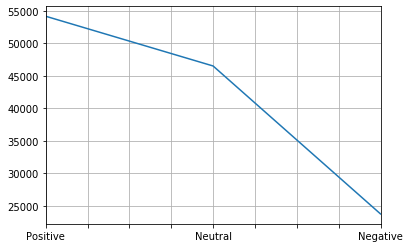

In [24]:
# Plotting and visualizing the counts
twitter_data['Analysis'].value_counts().plot(grid=True);

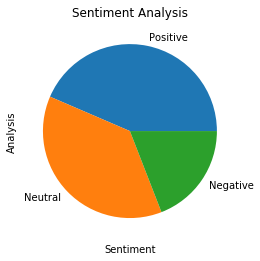

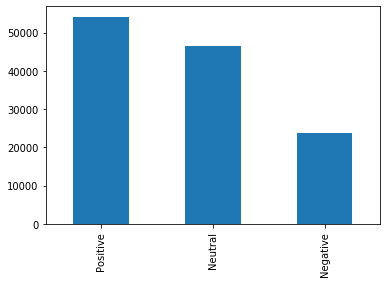

In [25]:
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Counts')
twitter_data['Analysis'].value_counts().plot(kind = 'pie')
plt.show()
twitter_data['Analysis'].value_counts().plot(kind = 'bar')
plt.show()